# Import

In [1]:
import os
import cv2
import csv
import math
import time
import numpy as np
import pandas as pd
import random
import matplotlib as mpl
import matplotlib.pyplot as plt

from tqdm import tqdm

# GPU Setting

In [2]:
import tensorflow as tf

print(tf.__version__)
print(tf.config.list_physical_devices())

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
    # Currently, memory growth needs to be the same across GPUs
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
      #  for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
        print(e)

2.6.0
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
1 Physical GPUs, 1 Logical GPUs


# Global Variables

In [3]:
LABEL_FILE = "../Label_Data_Info.xlsx"
VIDEO_PATH = "../../4_Cut_Video/data/"
COORDINATE_PATH = "../../4_Cut_Video/data/"
GRADCAM_PATH = "LOG/GradCAM_Explanations/"
FS_GRADCAM_PATH = "LOG_FS/GradCAM_Explanations/"

FS_RESULT_FILE = "LOG_FS/Walking_RandomSeed_FS/Results/10_FS_weighted.csv"

SEG_PROB_CUT1_FILE = "LOG/Segment_Probability/seg_probability_cut1.csv"
SEG_PROB_CUT2_FILE = "LOG/Segment_Probability/seg_probability_cut2.csv"
FS_SEG_PROB_CUT1_FILE = "LOG_FS/Segment_Probability/seg_probability_cut1.csv"
FS_SEG_PROB_CUT2_FILE = "LOG_FS/Segment_Probability/seg_probability_cut2.csv"

FOLDIDX_FILE = "../../5_Gait_and_Eye/Training_Fix_5Fold/walk_test_5fold.csv"

### 7_NewLabel/Walking_Subtask/LOG/Walking_RandomSeed/10/Parameters/threshold_5f.csv
### 7_NewLabel/Walking_Subtask/LOG_FS/Walking_RandomSeed_FS/10/Parameters/threshold_5f.csv
threshold_walk_5f = [0.42, 0.4, 0.44, 0.47, 0.4] 
FS_threshold_walk_5f = [0.4, 0.55, 0.42, 0.45, 0.4] 


n_GAP = 30
n_PERIOD = 50

IMG_HEIGHT = 1080
IMG_WIDTH = 1920

heatmap_feature_name = ['xHipAdd', 'xKneeAdd', 'xAnkleAdd', 'xHipMinus', 'xKneeMinus', 'xAnkleMinus', 
                        'yHipAdd', 'yKneeAdd', 'yAnkleAdd', 'yHipMinus', 'yKneeMinus', 'yAnkleMinus']

remove_dementia_pid_list = [22, 33, 57, 58, 64, 66, 67]
remove_dementia_pid_list_str = ['22', '33', '57', '58', '64', '66', '67']

# Global Data

In [11]:
def load_all_subject_id(dir_path):
    tmp_list = []
    for fname in list(os.listdir(dir_path)): ### ex. "37_cut1_Segment1.csv"
        pid = int(fname.split("_")[0])    ### ex. 37
        if pid not in tmp_list:
            # if pid not in remove_dementia_pid_list:
            tmp_list.append(pid)
    tmp_list.sort()
    return tmp_list


def load_segment_probability(cut1_filename, cut2_filename):
    cut1_dict, cut2_dict = {}, {}
    
    df_cut1 = pd.read_csv(cut1_filename, header=None)
    df_cut2 = pd.read_csv(cut2_filename, header=None)
    
    for idx in df_cut1.index:
        segName = df_cut1.iloc[idx][0]
        prob = df_cut1.iloc[idx][1]
        pid = int(segName.split('_')[0])
        segId = segName.split('_')[2]
        if pid not in cut1_dict: 
            cut1_dict[pid] = {}
        cut1_dict[pid]['segment_'+segId] = prob

    for idx in df_cut2.index:
        segName = df_cut2.iloc[idx][0]
        prob = df_cut2.iloc[idx][1]
        pid = int(segName.split('_')[0])
        segId = segName.split('_')[2]
        if pid not in cut2_dict: 
            cut2_dict[pid] = {}
        cut2_dict[pid]['segment_'+segId] = prob
    return cut1_dict, cut2_dict


def load_all_subject_label(filename):
    df_label = pd.read_excel(filename, usecols=['編號', 'Age', 'Gender', '_Label'])
    df_label = df_label.fillna(0)
    df_label = df_label.astype({"_Label": int})
    
    Label_df = df_label['_Label']
    Label_arr = np.array(Label_df)
    Label_dict = dict(zip(df_label.編號, df_label._Label))
    return Label_dict


def load_all_subject_prediction_result(filename):
    prob_dict = {}
    df = pd.read_csv(filename)
    for idx in df.index:
        pid = int(df.loc[idx]['pid'])
        prob = df.loc[idx]['avgProb']
        prob_dict[pid] = prob
    return prob_dict


def load_all_subject_foldIdx(filename):
    tmp_walk_testID_5f = []
    
    walk_file = open(filename, "r")
    tmp_walk_testID_5f = list(csv.reader(walk_file, delimiter=","))
    walk_file.close()

    tmp_dict = {}
    for foldIdx, fold in enumerate(tmp_walk_testID_5f):
        for pid in fold:
            # if pid not in remove_dementia_pid_list_str:
            tmp_dict[int(pid)] = foldIdx
    return tmp_dict

In [12]:
all_pid_list = []
all_pid_list = load_all_subject_id(FS_GRADCAM_PATH)
print(f'Number of Subjects: {len(all_pid_list)}')
print(all_pid_list)

Number of Subjects: 88
[1, 2, 3, 4, 5, 6, 7, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 43, 44, 45, 46, 48, 49, 51, 52, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]


In [13]:
label_dict = {}

label_dict = load_all_subject_label(LABEL_FILE)
print(f'Total Number of Subjects: {len(label_dict)}')
print(label_dict)

Total Number of Subjects: 100
{1: 0, 2: 0, 3: 0, 4: 1, 5: 0, 6: 0, 7: 0, 8: 0, 9: 1, 10: 1, 11: 1, 12: 1, 13: 0, 14: 0, 15: 0, 16: 1, 17: 1, 18: 1, 19: 0, 20: 1, 21: 0, 22: 0, 23: 1, 24: 1, 25: 1, 26: 1, 27: 1, 28: 1, 29: 0, 30: 0, 31: 1, 32: 1, 33: 0, 34: 0, 35: 1, 36: 1, 37: 1, 38: 1, 39: 1, 40: 1, 41: 0, 42: 0, 43: 0, 44: 0, 45: 1, 46: 1, 47: 0, 48: 1, 49: 0, 50: 0, 51: 0, 52: 0, 53: 0, 54: 0, 55: 0, 56: 0, 57: 0, 58: 0, 59: 1, 60: 1, 61: 1, 62: 1, 63: 0, 64: 0, 65: 1, 66: 0, 67: 0, 68: 0, 69: 0, 70: 0, 71: 0, 72: 0, 73: 0, 74: 0, 75: 0, 76: 0, 77: 0, 78: 0, 79: 0, 80: 0, 81: 0, 82: 0, 83: 0, 84: 0, 85: 0, 86: 0, 87: 0, 88: 0, 89: 0, 90: 0, 91: 0, 92: 0, 93: 0, 94: 0, 95: 0, 96: 0, 97: 0, 98: 0, 99: 0, 100: 0}


In [14]:
foldIdx_dict = {}

foldIdx_dict = load_all_subject_foldIdx(FOLDIDX_FILE)
print(f'Number of Subjects: {len(foldIdx_dict)}')
print(foldIdx_dict)

Number of Subjects: 88
{1: 0, 2: 0, 4: 0, 11: 0, 29: 0, 34: 0, 36: 0, 37: 0, 44: 0, 45: 0, 49: 0, 59: 0, 67: 0, 75: 0, 81: 0, 83: 0, 89: 0, 94: 0, 5: 1, 10: 1, 12: 1, 21: 1, 35: 1, 43: 1, 52: 1, 61: 1, 62: 1, 65: 1, 66: 1, 70: 1, 82: 1, 87: 1, 90: 1, 91: 1, 93: 1, 96: 1, 3: 2, 13: 2, 20: 2, 28: 2, 33: 2, 40: 2, 46: 2, 48: 2, 57: 2, 60: 2, 68: 2, 69: 2, 71: 2, 72: 2, 76: 2, 79: 2, 86: 2, 97: 2, 6: 3, 100: 3, 16: 3, 19: 3, 26: 3, 27: 3, 30: 3, 31: 3, 32: 3, 38: 3, 51: 3, 74: 3, 78: 3, 84: 3, 85: 3, 95: 3, 99: 3, 7: 4, 9: 4, 17: 4, 18: 4, 22: 4, 24: 4, 25: 4, 39: 4, 58: 4, 63: 4, 64: 4, 73: 4, 77: 4, 80: 4, 88: 4, 92: 4, 98: 4}


In [15]:
pidProb_dict = {}

pidProb_dict = load_all_subject_prediction_result(FS_RESULT_FILE)
print(pidProb_dict)

{1: 0.87, 2: 0.0008, 3: 0.083, 4: 0.9764, 5: 0.3738, 6: 0.9429, 7: 0.014, 9: 0.7918, 10: 0.9345, 11: 0.9243, 12: 0.7954, 13: 0.834, 16: 0.8524, 17: 0.92, 18: 0.7297, 19: 0.0231, 20: 0.628, 21: 0.3602, 22: 0.2684, 24: 0.7795, 25: 0.8048, 26: 0.8534, 27: 0.9227, 28: 0.9421, 29: 0.0136, 30: 0.0049, 31: 0.835, 32: 0.8691, 33: 0.0817, 34: 0.0392, 35: 0.9407, 36: 0.921, 37: 0.5808, 38: 0.9181, 39: 0.9003, 40: 0.3056, 43: 0.0038, 44: 0.0087, 45: 0.8616, 46: 0.756, 48: 0.6093, 49: 0.017, 51: 0.1872, 52: 0.0682, 57: 0.0795, 58: 0.0744, 59: 0.9629, 60: 0.7705, 61: 0.7834, 62: 0.8715, 63: 0.0916, 64: 0.331, 65: 0.9288, 66: 0.0298, 67: 0.6598, 68: 0.0883, 69: 0.0487, 70: 0.0, 71: 0.0308, 72: 0.3773, 73: 0.0495, 74: 0.0814, 75: 0.0, 76: 0.0342, 77: 0.0253, 78: 0.0087, 79: 0.0119, 80: 0.0307, 81: 0.0033, 82: 0.5222, 83: 0.2434, 84: 0.2459, 85: 0.0904, 86: 0.439, 87: 0.0164, 88: 0.0216, 89: 0.0033, 90: 0.0027, 91: 0.0926, 92: 0.0899, 93: 0.0181, 94: 0.8007, 95: 0.0143, 96: 0.0206, 97: 0.0207, 98: 0.3

In [18]:
segProb_cut1_dict = {}
segProb_cut2_dict = {}
FS_segProb_cut1_dict = {}
FS_segProb_cut2_dict = {}

# segProb_cut1_dict, segProb_cut2_dict = load_segment_probability(SEG_PROB_CUT1_FILE, SEG_PROB_CUT2_FILE)
FS_segProb_cut1_dict, FS_segProb_cut2_dict = load_segment_probability(FS_SEG_PROB_CUT1_FILE, FS_SEG_PROB_CUT2_FILE)

# print(f'Probability Result in Original:\n{segProb_cut1_dict[60]}\n')
print(f'Probability Result in Feature Selection:\n{FS_segProb_cut1_dict[60]}')

Probability Result in Feature Selection:
{'segment_3': 0.8438, 'segment_1': 0.9482, 'segment_0': 0.2122, 'segment_2': 0.952, 'segment_4': 0.1388}


In [19]:
# print(segProb_cut1_dict[65])
print(FS_segProb_cut1_dict[65])

{'segment_1': 0.9965, 'segment_0': 0.8898, 'segment_4': 0.0079, 'segment_5': 0.0507, 'segment_3': 0.0984, 'segment_2': 0.0038}


# Show on Video

In [26]:
def generate_mask(frameIdx, Hip, Knee, Ankle, left_Hip, right_Hip, left_Knee, right_Knee, left_Ankle, right_Ankle):
    mask = np.zeros((IMG_HEIGHT, IMG_WIDTH))
    
    n_frame = len(Hip)
    if frameIdx<n_frame:
        left_hip_x, left_hip_y, right_hip_x, right_hip_y = left_Hip[frameIdx][0], left_Hip[frameIdx][1], right_Hip[frameIdx][0], right_Hip[frameIdx][1]
        left_knee_x, left_knee_y, right_knee_x, right_knee_y = left_Knee[frameIdx][0], left_Knee[frameIdx][1], right_Knee[frameIdx][0], right_Knee[frameIdx][1]
        left_ankle_x, left_ankle_y, right_ankle_x, right_ankle_y = left_Ankle[frameIdx][0], left_Ankle[frameIdx][1], right_Ankle[frameIdx][0], right_Ankle[frameIdx][1]

        radius = 20
        for x in range(-radius, radius+1):
            for y in range(-radius, radius+1):
                if (left_hip_y+y)<IMG_HEIGHT and (left_hip_y+y)>0 and (left_hip_x+x)<IMG_WIDTH and (left_hip_x+x)>0 and (right_hip_y+y)<IMG_HEIGHT and (right_hip_y+y)>0 and (right_hip_x+x)<IMG_WIDTH and (right_hip_x+x)>0 :
                    mask[left_hip_y+y][left_hip_x+x], mask[right_hip_y+y][right_hip_x+x] = Hip[frameIdx], Hip[frameIdx]
                if (left_knee_y+y)<IMG_HEIGHT and (left_knee_y+y)>0 and (left_knee_x+x)<IMG_WIDTH and (left_knee_x+x)>0 and (right_knee_y+y)<IMG_HEIGHT and (right_knee_y+y)>0 and (right_knee_x+x)<IMG_WIDTH and (right_knee_x+x)>0 :
                    mask[left_knee_y+y][left_knee_x+x], mask[right_knee_y+y][right_knee_x+x] = Knee[frameIdx], Knee[frameIdx]
                if (left_ankle_y+y)<IMG_HEIGHT and (left_ankle_y+y)>0 and (left_ankle_x+x)<IMG_WIDTH and (left_ankle_x+x)>0 and (right_ankle_y+y)<IMG_HEIGHT and (right_ankle_y+y)>0 and (right_ankle_x+x)<IMG_WIDTH and (right_ankle_x+x)>0 :
                    mask[left_ankle_y+y][left_ankle_x+x], mask[right_ankle_y+y][right_ankle_x+x] = Ankle[frameIdx], Ankle[frameIdx]

    # mask = np.dstack((mask, mask, mask))
    mask = np.array(mask, dtype='uint8')
    mask = cv2.applyColorMap(mask, cv2.COLORMAP_JET) ### shape=(height, width, 3)
    return mask

In [27]:
### blur, green, red
# https://matplotlib.org/stable/users/explain/colors/colorbar_only.html
# https://www.tutorialspoint.com/map-values-to-colors-in-matplotlib
# https://matplotlib.org/stable/users/explain/colors/colormaps.html
# https://www.rapidtables.com/web/color/RGB_Color.html
COLOR_White = (255, 255, 255)      # (0)
COLOR_DarkBlue = (140, 0, 0)       # (1~24)
COLOR_Blue = (210, 0, 0)           # (25~49)
COLOR_LightBlue = (250, 206, 135)  # (50~74)
COLOR_AquaMarine = (212, 255, 127) # (75~99)
COLOR_Green = (144, 238, 144)      # (100~124)
COLOR_Yellow = (0, 255, 255)       # (125~149)
COLOR_Gold = (0, 215, 255)         # (150~169)
COLOR_Orange = (0, 165, 255)       # (170~189)
COLOR_OrangeRed = (0, 69, 255)     # (190~209)
COLOR_Red = (0, 0, 250)            # (210~229)
COLOR_DarkRed = (0, 0, 139)        # (230~255)

## Original

In [28]:
def read_explanation_from_csv_file(target_pid, dir_path):
    heatmap_dict = {}
    for fname in list(os.listdir(dir_path)): ### ex. "37_cut1_Segment1.csv"
        pid = int(fname.split("_")[0])       ### ex. 37
        videoType = fname.split("_")[1]      ### ex. cut1
        segmentName = fname.split(".")[0].split("_")[2]    ### ex. Segment1

        if pid==target_pid:
            filepath = dir_path + fname      ### ex. "Walking_Model2_0409/GradCAM_Explanations/37_cut1_Segment1.csv"
            df = pd.read_csv(filepath, index_col=0, header=None) ### Set first column as index

            if videoType not in heatmap_dict:
                heatmap_dict[videoType] = {}
            heatmap_dict[videoType][segmentName] = df
    return heatmap_dict


def show_GradCAM_on_video(pid, video_dir, coord_dir, heatmap_dict, videoType):
    ### ============================================== Get heatmap value of [Hip, Knee, Ankle] ==============================================
    heatmap_dict = heatmap_dict[videoType] # print(heatmap_dict.keys()) ### ex. ["Segment0", "Segment1"]
    segmentNames = list(heatmap_dict.keys())
    segmentNames.sort()
    sorted_dict = {segName: heatmap_dict[segName] for segName in segmentNames}
    heatmap_dict = sorted_dict

    ### ------------------ Get some info [start] ------------------
    label = label_dict[pid]
    foldIdx = foldIdx_dict[pid]
    threshold = threshold_walk_5f[foldIdx]
    prob_dict = segProb_cut1_dict[pid] ### ex. prob_dict = {'segment_0': 0.876, 'segment_1': 0.9994}
    if videoType=='cut2M': prob_dict = segProb_cut2_dict[pid]

    prob_dict_rename = {} ### ex. prob_dict_rename = {'Segment0': 0.876, 'Segment1': 0.9994}
    for key in prob_dict:
        prob = prob_dict[key]
        segName = 'Segment' + str(key.split('_')[1])
        prob_dict_rename[segName] = prob
    ### ------------------- Get some info [end] -------------------

    n_segment = len(heatmap_dict)
    n_frame = (n_segment-1)*n_GAP + n_PERIOD
    Hip = [0] * n_frame
    Knee = [0] * n_frame
    Ankle = [0] * n_frame
    Times = [0] * n_frame
    Avg = [0] * n_frame

    start = 0
    end = n_PERIOD
    for key in heatmap_dict:
        prob = prob_dict_rename[key]
        flag_draw_heatmap = False

        if label==0:
            if prob < threshold: flag_draw_heatmap = True
        elif label==1:
            if prob > threshold: flag_draw_heatmap = True

        if flag_draw_heatmap==True:
            heatmap = heatmap_dict[key] ### heatmap for one segment
    
            n_feature, n_timestamp = heatmap.shape[0], heatmap.shape[1] ### 12 features with 50 timestamp
            heatmap = heatmap.iloc[:, :].values
    
            for i in range(n_timestamp):
                cur_frame = start + i
                
                hip1, hip2, hip3, hip4 = heatmap[0][i], heatmap[3][i], heatmap[6][i], heatmap[9][i]
                knee1, knee2, knee3, knee4 = heatmap[1][i], heatmap[4][i], heatmap[7][i], heatmap[10][i]
                ankle1, ankle2, ankle3, ankle4 = heatmap[2][i], heatmap[5][i], heatmap[8][i], heatmap[11][i]
    
                hip = max(hip1, hip2, hip3, hip4)
                knee = max(knee1, knee2, knee3, knee4)
                ankle = max(ankle1, ankle2, ankle3, ankle4)
    
                Hip[cur_frame] += hip
                Knee[cur_frame] += knee
                Ankle[cur_frame] += ankle
                Times[cur_frame] += 1
                Avg[cur_frame] = max(hip, knee, ankle)
                # Avg[cur_frame] = (hip+knee+ankle)/3

        start += n_GAP
        end = start + n_PERIOD

    for i in range(n_frame):
        if Times[i]!=0:
            Hip[i] = int(Hip[i]/Times[i])
            Knee[i] = int(Knee[i]/Times[i])
            Ankle[i] = int(Ankle[i]/Times[i])
            Avg[i] = int(Avg[i]/Times[i])
            
    ### ---------- Get Color Mapping [start] ----------
    max_Avg = max(Avg)
    color_map = mpl.colormaps.get_cmap('jet') # 'cool', viridis'
    # for i in range(len(Avg)):
    #     Avg[i] = int(Avg[i]*255/max_Avg)
    norm = mpl.colors.Normalize(vmin=min(Avg), vmax=max(Avg))
    color_mapper = mpl.cm.ScalarMappable(norm=norm, cmap=color_map)
    fig, ax = plt.subplots(figsize=(6, 1), layout='constrained')
    fig.colorbar(color_mapper, cax=ax, orientation='horizontal', label='Some Units')
    # ## ---------- Get Color Mapping [end] ----------



    ### ============================================== Get Coordinate of Left/Right [Hip, Knee, Ankle] ==============================================
    ### ex. 4_Cut_Video/data/37/Walking_0817/37_cut1_keypoints1.csv
    ### ex. 4_Cut_Video/data/37/Walking_0817/37_cut2_keypoints1.csv
    coord_csv_file = coord_dir + str(pid) + '/Walking_0817/' + str(pid) + '_' + videoType + '_keypoints1.csv'
    if pid>=1 and pid<=9:
        coord_csv_file = coord_dir + ("%02d" % pid) + '/Walking_0817/' + ("%02d" % pid) + '_' + videoType + '_keypoints1.csv'
    print(coord_csv_file)

    if os.path.exists(coord_csv_file)==False:
        print(f'[pid {pid}] CSV file does NOT exist.')
    else:
        coord_df = pd.read_csv(coord_csv_file, header=None)
        coord_arr = coord_df.iloc[:, :].values ### (xxx, 51) = xxx rows & 51 cols

    left_Hip, right_Hip = [], []
    left_Knee, right_Knee = [], []
    left_Ankle, right_Ankle = [], []
    LEFT_HIP, LEFT_KNEE, LEFT_ANKLE = [33, 34], [39, 40], [45, 46]
    RIGHT_HIP, RIGHT_KNEE, RIGHT_ANKLE = [36, 37], [42, 43], [48, 49]    
    for i in range(n_frame): ### based on the number of frames in Grad-CAM heatmap
        left_Hip.append([int(coord_arr[i][LEFT_HIP[0]]), int(coord_arr[i][LEFT_HIP[1]])])
        right_Hip.append([int(coord_arr[i][RIGHT_HIP[0]]), int(coord_arr[i][RIGHT_HIP[1]])])
        left_Knee.append([int(coord_arr[i][LEFT_KNEE[0]]), int(coord_arr[i][LEFT_KNEE[1]])])
        right_Knee.append([int(coord_arr[i][RIGHT_KNEE[0]]), int(coord_arr[i][RIGHT_KNEE[1]])])
        left_Ankle.append([int(coord_arr[i][LEFT_ANKLE[0]]), int(coord_arr[i][LEFT_ANKLE[1]])])
        right_Ankle.append([int(coord_arr[i][RIGHT_ANKLE[0]]), int(coord_arr[i][RIGHT_ANKLE[1]])])


    ### ============================================================== Show on Video ==============================================================
    video_fname_src = VIDEO_PATH + str(pid) + '/Walking_0817/' + str(pid) + '_' + videoType + '.mp4'
    # video_fname_dst = VIDEO_PATH + str(pid) + '/Walking_GradCAM_20240409/' + str(pid) + '_' + videoType + '.mp4'
    # video_fname_dst = VIDEO_PATH + str(pid) + '/Walking_GradCAM_20240425/' + str(pid) + '_' + videoType + '.mp4'
    video_fname_dst = VIDEO_PATH + str(pid) + '/Walking_GradCAM_20240502/' + str(pid) + '_' + videoType + '.mp4'
    if pid>=1 and pid<=9:
        video_fname_src = VIDEO_PATH + ("%02d" % pid) + '/Walking_0817/' + ("%02d" % pid) + '_' + videoType + '.mp4'
        # video_fname_dst = VIDEO_PATH + ("%02d" % pid) + '/Walking_GradCAM_20240409/' + ("%02d" % pid) + '_' + videoType + '.mp4'
        # video_fname_dst = VIDEO_PATH + ("%02d" % pid) + '/Walking_GradCAM_20240425/' + ("%02d" % pid) + '_' + videoType + '.mp4'
    video_fname_dst = VIDEO_PATH + ("%02d" % pid) + '/Walking_GradCAM_20240502/' + ("%02d" % pid) + '_' + videoType + '.mp4'
    if pid>=1 and pid<=9:
        if not os.path.exists(VIDEO_PATH + ("%02d" % pid) + '/Walking_GradCAM_20240502/'):
            os.makedirs(VIDEO_PATH + ("%02d" % pid) + '/Walking_GradCAM_20240502/')
    else:
        if not os.path.exists(VIDEO_PATH + str(pid) + '/Walking_GradCAM_20240502/'):
            os.makedirs(VIDEO_PATH + str(pid) + '/Walking_GradCAM_20240502/')
    print(f'{video_fname_dst}')
    
    ### Get video info
    cap = cv2.VideoCapture(video_fname_src)
    FPS = cap.get(cv2.CAP_PROP_FPS)
    
    ### Define video writer
    VIDEO_CODEC = "mp4v"
    OUT_WIDTH, OUT_HEIGHT = IMG_WIDTH, IMG_HEIGHT
    video_writer = cv2.VideoWriter(video_fname_dst, cv2.VideoWriter_fourcc(*VIDEO_CODEC), 10, (IMG_WIDTH, IMG_HEIGHT))

    n_video_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    for frameIdx, frame in enumerate(tqdm(range(n_video_frames), total=n_video_frames)):
        ret, img = cap.read()
        if ret==False: break

        # ## ------------------ Drawing Method 1 [start] ------------------
        # img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)
        # mask = generate_mask(frameIdx, Hip, Knee, Ankle, left_Hip, right_Hip, left_Knee, right_Knee, left_Ankle, right_Ankle)
        # img_masked = cv2.addWeighted(mask, 0.5, img, 0.5, 0)
        # img_masked = cv2.putText(img_masked, 'frameIdx: '+str(frameIdx), org=(50,100),
        #                          color=(0,0,255), thickness=2, fontScale=2, fontFace=cv2.FONT_HERSHEY_SIMPLEX, lineType=cv2.LINE_AA)
        # video_writer.write(img_masked)
        # ## ------------------ Drawing Method 1 [end] ------------------

        ### ------------------ Drawing Method 2 [start] ------------------
        img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)
        if frameIdx<n_frame:
            # [Method 2-1] ----------------------
            # cValue = Avg[frameIdx]
            # cRed = int(color_mapper.to_rgba(cValue)[0]*255)
            # cGreen = int(color_mapper.to_rgba(cValue)[1]*255)
            # cBlue = int(color_mapper.to_rgba(cValue)[2]*255)
            # target_color = (cBlue, cGreen, cRed) # print(f'{cValue}, {cBlue}, {cGreen}, {cRed}')
            # if cValue==0: target_color=COLOR_White
            # img = cv2.circle(img, center=(left_Hip[frameIdx][0], left_Hip[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            # img = cv2.circle(img, center=(left_Knee[frameIdx][0], left_Knee[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            # img = cv2.circle(img, center=(left_Ankle[frameIdx][0], left_Ankle[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            # img = cv2.circle(img, center=(right_Hip[frameIdx][0], right_Hip[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            # img = cv2.circle(img, center=(right_Knee[frameIdx][0], right_Knee[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            # img = cv2.circle(img, center=(right_Ankle[frameIdx][0], right_Ankle[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            # img = cv2.line(img, (left_Hip[frameIdx][0], left_Hip[frameIdx][1]), (left_Knee[frameIdx][0], left_Knee[frameIdx][1]), color=target_color, thickness=4)
            # img = cv2.line(img, (left_Knee[frameIdx][0], left_Knee[frameIdx][1]), (left_Ankle[frameIdx][0], left_Ankle[frameIdx][1]), color=target_color, thickness=4)
            # img = cv2.line(img, (right_Hip[frameIdx][0], right_Hip[frameIdx][1]), (right_Knee[frameIdx][0], right_Knee[frameIdx][1]), color=target_color, thickness=4)
            # img = cv2.line(img, (right_Knee[frameIdx][0], right_Knee[frameIdx][1]), (right_Ankle[frameIdx][0], right_Ankle[frameIdx][1]), color=target_color, thickness=4)
            # img = cv2.putText(img, 'frameIdx: '+str(frameIdx), org=(50,100), color=(0,0,255), thickness=2, fontScale=2, fontFace=cv2.FONT_HERSHEY_SIMPLEX, lineType=cv2.LINE_AA)
        
            
            # [Method 2-2] ----------------------
            if Avg[frameIdx]==0: target_color = COLOR_White
            elif Avg[frameIdx]>=1 and Avg[frameIdx]<25: target_color = COLOR_DarkBlue
            elif Avg[frameIdx]>=25 and Avg[frameIdx]<50: target_color = COLOR_Blue
            elif Avg[frameIdx]>=50 and Avg[frameIdx]<75: target_color = COLOR_LightBlue
            elif Avg[frameIdx]>=75 and Avg[frameIdx]<100: target_color = COLOR_AquaMarine
            elif Avg[frameIdx]>=100 and Avg[frameIdx]<125: target_color = COLOR_Green
            elif Avg[frameIdx]>=125 and Avg[frameIdx]<150: target_color = COLOR_Yellow
            elif Avg[frameIdx]>=150 and Avg[frameIdx]<170: target_color = COLOR_Gold
            elif Avg[frameIdx]>=170 and Avg[frameIdx]<190: target_color = COLOR_Orange
            elif Avg[frameIdx]>=190 and Avg[frameIdx]<210: target_color = COLOR_OrangeRed
            elif Avg[frameIdx]>=210 and Avg[frameIdx]<230: target_color = COLOR_Red
            elif Avg[frameIdx]>=230 and Avg[frameIdx]<=255: target_color = COLOR_DarkRed
            img = cv2.circle(img, center=(left_Hip[frameIdx][0], left_Hip[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(left_Knee[frameIdx][0], left_Knee[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(left_Ankle[frameIdx][0], left_Ankle[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(right_Hip[frameIdx][0], right_Hip[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(right_Knee[frameIdx][0], right_Knee[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(right_Ankle[frameIdx][0], right_Ankle[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            img = cv2.line(img, (left_Hip[frameIdx][0], left_Hip[frameIdx][1]), (left_Knee[frameIdx][0], left_Knee[frameIdx][1]), color=target_color, thickness=4)
            img = cv2.line(img, (left_Knee[frameIdx][0], left_Knee[frameIdx][1]), (left_Ankle[frameIdx][0], left_Ankle[frameIdx][1]), color=target_color, thickness=4)
            img = cv2.line(img, (right_Hip[frameIdx][0], right_Hip[frameIdx][1]), (right_Knee[frameIdx][0], right_Knee[frameIdx][1]), color=target_color, thickness=4)
            img = cv2.line(img, (right_Knee[frameIdx][0], right_Knee[frameIdx][1]), (right_Ankle[frameIdx][0], right_Ankle[frameIdx][1]), color=target_color, thickness=4)
            img = cv2.putText(img, 'frameIdx: '+str(frameIdx), org=(50,100), color=(0,0,255), thickness=2, fontScale=2, fontFace=cv2.FONT_HERSHEY_SIMPLEX, lineType=cv2.LINE_AA)
            
        video_writer.write(img)
        ### ------------------- Drawing Method 2 [end] -------------------
        
        if frameIdx==0:
            # mask = generate_mask(frameIdx, Hip, Knee, Ankle, left_Hip, right_Hip, left_Knee, right_Knee, left_Ankle, right_Ankle)
            plt.figure(figsize=(5, 3))
            plt.axis("off")
            plt.imshow(img)
            # plt.imshow(mask)
            plt.title(f'frameIdx: {frameIdx}')
            plt.show()
    video_writer.release()
    cap.release()

../../4_Cut_Video/data/16/Walking_0817/16_cut1_keypoints1.csv
../../4_Cut_Video/data/16/Walking_GradCAM_20240502/16_cut1.mp4


  0%|          | 0/175 [00:00<?, ?it/s]

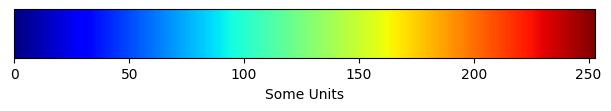

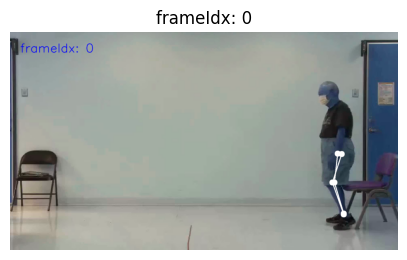

100%|██████████| 175/175 [00:03<00:00, 53.48it/s]


In [29]:
for pid in all_pid_list:
    if pid==16:
    # if pid==4 or pid==10 or pid==25 or pid==26 or pid==38 or pid==39 or pid==59 or pid==60 or pid==62:
        heatmap_dict = {}
        heatmap_dict = read_explanation_from_csv_file(pid, GRADCAM_PATH)
        # print(heatmap_dict.keys())
        # print(len(heatmap_dict))

        show_GradCAM_on_video(pid, VIDEO_PATH, COORDINATE_PATH, heatmap_dict, "cut1")
        # show_GradCAM_on_video(pid, VIDEO_PATH, COORDINATE_PATH, exp_dict, "cut2M")

## Feature Selection (Dynamic)

In [40]:
FS_feature_name = ['xHipMinus', 'xKneeMinus', 'xAnkleMinus', 'yHipAdd', 'yKneeAdd', 'yAnkleAdd', 'yHipMinus', 'yKneeMinus', 'yAnkleMinus']


def FS_read_explanation_from_csv_file(target_pid, dir_path):
    heatmap_dict = {}
    for fname in list(os.listdir(dir_path)): ### ex. "37_cut1_Segment1.csv"
        pid = int(fname.split("_")[0])       ### ex. 37
        videoType = fname.split("_")[1]      ### ex. cut1
        segmentName = fname.split(".")[0].split("_")[2]    ### ex. Segment1

        if pid==target_pid:
            filepath = dir_path + fname      ### ex. "Walking_Model2_0409/FS_Dynamic_GradCAM_Explanations/37_cut1_Segment1.csv"
            df = pd.read_csv(filepath, index_col=0, header=None) ### Set first column as index

            if videoType not in heatmap_dict:
                heatmap_dict[videoType] = {}
            heatmap_dict[videoType][segmentName] = df
    return heatmap_dict
    

def FS_show_GradCAM_on_video(pid, video_dir, coord_dir, heatmap_dict, videoType):
    ### ============================================== Get heatmap value of [Hip, Knee, Ankle] ==============================================
    heatmap_dict = heatmap_dict[videoType] ### ex. heatmap_dict.keys() = ["Segment0", "Segment1"]
    segmentNames = list(heatmap_dict.keys())
    segmentNames.sort()
    sorted_dict = {segName: heatmap_dict[segName] for segName in segmentNames}
    heatmap_dict = sorted_dict

    ### ------------------ Get some info [start] ------------------
    label = label_dict[pid]
    foldIdx = foldIdx_dict[pid]
    threshold = FS_threshold_walk_5f[foldIdx]
    prob_dict = FS_segProb_cut1_dict[pid] ### ex. prob_dict = {'segment_0': 0.876, 'segment_1': 0.9994}
    if videoType=='cut2M': prob_dict = FS_segProb_cut2_dict[pid]

    prob_dict_rename = {} ### ex. prob_dict_rename = {'Segment0': 0.876, 'Segment1': 0.9994}
    for key in prob_dict:
        prob = prob_dict[key]
        segName = 'Segment' + str(key.split('_')[1])
        prob_dict_rename[segName] = prob
    ### ------------------- Get some info [end] -------------------
    
    n_segment = len(heatmap_dict)
    n_frame = (n_segment-1)*n_GAP + n_PERIOD
    Hip = [0] * n_frame
    Knee = [0] * n_frame
    Ankle = [0] * n_frame
    Times = [0] * n_frame
    Avg = [0] * n_frame

    start = 0
    end = n_PERIOD
    for key in heatmap_dict:
        prob = prob_dict_rename[key]
        print(f'Prob of segment: {prob}')
        flag_draw_heatmap = False

        if label==0:
            if prob < threshold: flag_draw_heatmap = True
        elif label==1:
            if prob > threshold: flag_draw_heatmap = True

        if flag_draw_heatmap==True:
            heatmap = heatmap_dict[key] ### heatmap for one segment
    
            n_feature, n_timestamp = heatmap.shape[0], heatmap.shape[1] ### 12 features with 50 timestamp
            heatmap = heatmap.iloc[:, :].values
    
            for i in range(n_timestamp):
                cur_frame = start + i
    
                hip1, hip2, hip3 = heatmap[0][i], heatmap[3][i], heatmap[6][i]
                knee1, knee2, knee3 = heatmap[1][i], heatmap[4][i], heatmap[7][i]
                ankle1, ankle2, ankle3 = heatmap[2][i], heatmap[5][i], heatmap[8][i]
    
                hip = max(hip1, hip2, hip3)
                knee = max(knee1, knee2, knee3)
                ankle = max(ankle1, ankle2, ankle3)
    
                Hip[cur_frame] += hip
                Knee[cur_frame] += knee
                Ankle[cur_frame] += ankle
                Times[cur_frame] += 1
                # Avg[cur_frame] = max(hip, knee, ankle) # 20240509
                # Avg[cur_frame] = (hip+knee+ankle)/3    # 20240509
                Avg[cur_frame] += max(hip, knee, ankle)   # 20240516

        start += n_GAP
        end = start + n_PERIOD

    for i in range(n_frame):
        if Times[i]!=0:
            Hip[i] = int(Hip[i]/Times[i])
            Knee[i] = int(Knee[i]/Times[i])
            Ankle[i] = int(Ankle[i]/Times[i])
            Avg[i] = int(Avg[i]/Times[i])
            
    # ## ---------- Get Color Mapping [start] ----------
    # Version 1: 20240509
    # max_Avg = max(Avg)
    # color_map = mpl.colormaps.get_cmap('jet') # 'cool', viridis'
    # # for i in range(len(Avg)):
    # #     Avg[i] = int(Avg[i]*255/max_Avg)
    # norm = mpl.colors.Normalize(vmin=min(Avg), vmax=max(Avg))
    # color_mapper = mpl.cm.ScalarMappable(norm=norm, cmap=color_map)
    # # fig, ax = plt.subplots(figsize=(6, 1), layout='constrained')
    # # fig.colorbar(color_mapper, cax=ax, orientation='horizontal', label='Some Units')
    
    # Version 2: 20240516
    heatmap_min_max = np.array([0, 255])
    color_map = mpl.colormaps.get_cmap('jet') # 'cool', viridis'
    norm = mpl.colors.Normalize(vmin=min(heatmap_min_max), vmax=max(heatmap_min_max))
    color_mapper = mpl.cm.ScalarMappable(norm=norm, cmap=color_map)
    # ## ---------- Get Color Mapping [end] ------------

        
    ### ============================================== Get Coordinate of Left/Right [Hip, Knee, Ankle] ==============================================
    ### ex. 4_Cut_Video/data/37/Walking_0817/37_cut1_keypoints1.csv
    ### ex. 4_Cut_Video/data/37/Walking_0817/37_cut2_keypoints1.csv
    if videoType=="cut2M": videoType = "cut2"
    coord_csv_file = coord_dir + str(pid) + '/Walking_0817/' + str(pid) + '_' + videoType + '_keypoints1.csv'
    if pid>=1 and pid<=9:
        coord_csv_file = coord_dir + ("%02d" % pid) + '/Walking_0817/' + ("%02d" % pid) + '_' + videoType + '_keypoints1.csv'
    print(coord_csv_file)

    if os.path.exists(coord_csv_file)==False:
        print(f'[pid {pid}] CSV file does NOT exist.')
    else:
        coord_df = pd.read_csv(coord_csv_file, header=None)
        coord_arr = coord_df.iloc[:, :].values ### (xxx, 51) = xxx rows & 51 cols

    left_Hip, right_Hip = [], []
    left_Knee, right_Knee = [], []
    left_Ankle, right_Ankle = [], []
    LEFT_HIP, LEFT_KNEE, LEFT_ANKLE = [33, 34], [39, 40], [45, 46]
    RIGHT_HIP, RIGHT_KNEE, RIGHT_ANKLE = [36, 37], [42, 43], [48, 49]    
    for i in range(n_frame): ### based on the number of frames in Grad-CAM heatmap
        left_Hip.append([int(coord_arr[i][LEFT_HIP[0]]), int(coord_arr[i][LEFT_HIP[1]])])
        right_Hip.append([int(coord_arr[i][RIGHT_HIP[0]]), int(coord_arr[i][RIGHT_HIP[1]])])
        left_Knee.append([int(coord_arr[i][LEFT_KNEE[0]]), int(coord_arr[i][LEFT_KNEE[1]])])
        right_Knee.append([int(coord_arr[i][RIGHT_KNEE[0]]), int(coord_arr[i][RIGHT_KNEE[1]])])
        left_Ankle.append([int(coord_arr[i][LEFT_ANKLE[0]]), int(coord_arr[i][LEFT_ANKLE[1]])])
        right_Ankle.append([int(coord_arr[i][RIGHT_ANKLE[0]]), int(coord_arr[i][RIGHT_ANKLE[1]])])


    ### ============================================================== Show on Video ==============================================================
    # FPS = 10
    # FPS = 30
    FPS = 1
    
    if videoType=="cut2": videoType = "cut2_mirrored"
    video_fname_src = VIDEO_PATH + str(pid) + '/Walking_0817/' + str(pid) + '_' + videoType + '.mp4'
    video_fname_dst = VIDEO_PATH + str(pid) + '/Walking_FS_GradCAM/' + '0814_' + videoType + '_FPS' + str(FPS) + '.mp4'
    # video_fname_dst = VIDEO_PATH + str(pid) + '/Walking_FS_GradCAM/' + '0627_' + videoType + '_FPS' + str(FPS) + '.mp4'
    # video_fname_dst = VIDEO_PATH + str(pid) + '/Walking_FS_GradCAM_20240509/' + str(pid) + '_' + videoType + '_FPS' + str(FPS) + '.mp4'  # /Walking_FS_GradCAM_20240425/
    #                                                                                                                                      # /Walking_FS_GradCAM_20240502/
    if pid>=1 and pid<=9:
        video_fname_src = VIDEO_PATH + ("%02d" % pid) + '/Walking_0817/' + ("%02d" % pid) + '_' + videoType + '.mp4'
        video_fname_dst = VIDEO_PATH + ("%02d" % pid) + '/Walking_FS_GradCAM/' + '0814_' + videoType + '_FPS' + str(FPS) + '.mp4'
        # video_fname_dst = VIDEO_PATH + ("%02d" % pid) + '/Walking_FS_GradCAM/' + '0627_' + videoType + '_FPS' + str(FPS) + '.mp4'
        # video_fname_dst = VIDEO_PATH + ("%02d" % pid) + '/Walking_FS_GradCAM_20240509/' + ("%02d" % pid) + '_' + videoType + '_FPS' + str(FPS) + '.mp4'
    
    if pid>=1 and pid<=9:
        if not os.path.exists(VIDEO_PATH + ("%02d" % pid) + '/Walking_FS_GradCAM/'):
            os.makedirs(VIDEO_PATH + ("%02d" % pid) + '/Walking_FS_GradCAM/')
    else:
        if not os.path.exists(VIDEO_PATH + str(pid) + '/Walking_FS_GradCAM/'):
            os.makedirs(VIDEO_PATH + str(pid) + '/Walking_FS_GradCAM/')
    print(f'{video_fname_dst}')
    
    ### Get video info
    cap = cv2.VideoCapture(video_fname_src)
    FPS = cap.get(cv2.CAP_PROP_FPS)
    
    ### Define video writer
    VIDEO_CODEC = "mp4v"
    OUT_WIDTH, OUT_HEIGHT = IMG_WIDTH, IMG_HEIGHT
    # video_writer = cv2.VideoWriter(video_fname_dst, cv2.VideoWriter_fourcc(*VIDEO_CODEC), FPS, (IMG_WIDTH, IMG_HEIGHT))
    video_writer = cv2.VideoWriter(video_fname_dst, cv2.VideoWriter_fourcc(*VIDEO_CODEC), 1, (IMG_WIDTH, IMG_HEIGHT))

    n_video_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    for frameIdx, frame in enumerate(tqdm(range(n_video_frames), total=n_video_frames)):
        ret, img = cap.read()
        if ret==False: break
            
        # ## ------------------ Drawing Method 1 [start] ------------------
        # img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)
        # mask = generate_mask(frameIdx, Hip, Knee, Ankle, left_Hip, right_Hip, left_Knee, right_Knee, left_Ankle, right_Ankle)
        # img_masked = cv2.addWeighted(mask, 0.5, img, 0.5, 0)
        # img_masked = cv2.putText(img_masked, 'frameIdx: '+str(frameIdx), org=(50,100),
        #                          color=(0,0,255), thickness=2, fontScale=2, fontFace=cv2.FONT_HERSHEY_SIMPLEX, lineType=cv2.LINE_AA)
        # video_writer.write(img_masked)
        # ## ------------------ Drawing Method 1 [end] ------------------

        # ## ------------------ Drawing Method 2 [start] ------------------
        img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)
        if frameIdx<n_frame:
            # [Method 2-1] ----------------------
            cValue = Avg[frameIdx]
            cRed = int(color_mapper.to_rgba(cValue)[0]*255)
            cGreen = int(color_mapper.to_rgba(cValue)[1]*255)
            cBlue = int(color_mapper.to_rgba(cValue)[2]*255)
            target_color = (cBlue, cGreen, cRed)
            if cValue==0: target_color=COLOR_White
            # # print(f'{cValue}, {cBlue}, {cGreen}, {cRed}')
            img = cv2.circle(img, center=(left_Hip[frameIdx][0], left_Hip[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(left_Knee[frameIdx][0], left_Knee[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(left_Ankle[frameIdx][0], left_Ankle[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(right_Hip[frameIdx][0], right_Hip[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(right_Knee[frameIdx][0], right_Knee[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            img = cv2.circle(img, center=(right_Ankle[frameIdx][0], right_Ankle[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            # img = cv2.line(img, (left_Hip[frameIdx][0], left_Hip[frameIdx][1]), (left_Knee[frameIdx][0], left_Knee[frameIdx][1]), color=target_color, thickness=4)
            # img = cv2.line(img, (left_Knee[frameIdx][0], left_Knee[frameIdx][1]), (left_Ankle[frameIdx][0], left_Ankle[frameIdx][1]), color=target_color, thickness=4)
            # img = cv2.line(img, (right_Hip[frameIdx][0], right_Hip[frameIdx][1]), (right_Knee[frameIdx][0], right_Knee[frameIdx][1]), color=target_color, thickness=4)
            # img = cv2.line(img, (right_Knee[frameIdx][0], right_Knee[frameIdx][1]), (right_Ankle[frameIdx][0], right_Ankle[frameIdx][1]), color=target_color, thickness=4)
            img = cv2.putText(img, 'frameIdx: '+str(frameIdx), org=(50,100), color=(0,0,255), thickness=2, fontScale=2, fontFace=cv2.FONT_HERSHEY_SIMPLEX, lineType=cv2.LINE_AA)

            # [Method 2-2] ----------------------
            # if Avg[frameIdx]==0: target_color = COLOR_White
            # elif Avg[frameIdx]>=1 and Avg[frameIdx]<25: target_color = COLOR_DarkBlue
            # elif Avg[frameIdx]>=25 and Avg[frameIdx]<50: target_color = COLOR_Blue
            # elif Avg[frameIdx]>=50 and Avg[frameIdx]<75: target_color = COLOR_LightBlue
            # elif Avg[frameIdx]>=75 and Avg[frameIdx]<100: target_color = COLOR_AquaMarine
            # elif Avg[frameIdx]>=100 and Avg[frameIdx]<125: target_color = COLOR_Green
            # elif Avg[frameIdx]>=125 and Avg[frameIdx]<150: target_color = COLOR_Yellow
            # elif Avg[frameIdx]>=150 and Avg[frameIdx]<170: target_color = COLOR_Gold
            # elif Avg[frameIdx]>=170 and Avg[frameIdx]<190: target_color = COLOR_Orange
            # elif Avg[frameIdx]>=190 and Avg[frameIdx]<210: target_color = COLOR_OrangeRed
            # elif Avg[frameIdx]>=210 and Avg[frameIdx]<230: target_color = COLOR_Red
            # elif Avg[frameIdx]>=230 and Avg[frameIdx]<=255: target_color = COLOR_DarkRed
            # img = cv2.circle(img, center=(left_Hip[frameIdx][0], left_Hip[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            # img = cv2.circle(img, center=(left_Knee[frameIdx][0], left_Knee[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            # img = cv2.circle(img, center=(left_Ankle[frameIdx][0], left_Ankle[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            # img = cv2.circle(img, center=(right_Hip[frameIdx][0], right_Hip[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            # img = cv2.circle(img, center=(right_Knee[frameIdx][0], right_Knee[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            # img = cv2.circle(img, center=(right_Ankle[frameIdx][0], right_Ankle[frameIdx][1]), radius=15, color=target_color, thickness=-1)
            # img = cv2.line(img, (left_Hip[frameIdx][0], left_Hip[frameIdx][1]), (left_Knee[frameIdx][0], left_Knee[frameIdx][1]), color=target_color, thickness=4)
            # img = cv2.line(img, (left_Knee[frameIdx][0], left_Knee[frameIdx][1]), (left_Ankle[frameIdx][0], left_Ankle[frameIdx][1]), color=target_color, thickness=4)
            # img = cv2.line(img, (right_Hip[frameIdx][0], right_Hip[frameIdx][1]), (right_Knee[frameIdx][0], right_Knee[frameIdx][1]), color=target_color, thickness=4)
            # img = cv2.line(img, (right_Knee[frameIdx][0], right_Knee[frameIdx][1]), (right_Ankle[frameIdx][0], right_Ankle[frameIdx][1]), color=target_color, thickness=4)
            # img = cv2.putText(img, 'frameIdx: '+str(frameIdx), org=(50,100), color=(0,0,255), thickness=2, fontScale=2, fontFace=cv2.FONT_HERSHEY_SIMPLEX, lineType=cv2.LINE_AA)
            
        video_writer.write(img)
        # ## ------------------ Drawing Method 2 [end] ------------------
        
        if frameIdx==0:
            # mask = generate_mask(frameIdx, Hip, Knee, Ankle, left_Hip, right_Hip, left_Knee, right_Knee, left_Ankle, right_Ankle)
            plt.figure(figsize=(5, 3))
            plt.axis("off")
            plt.imshow(img)
            # plt.imshow(mask)
            plt.title(f'frameIdx: {frameIdx}')
            plt.show()
    video_writer.release()
    cap.release()

Prob of segment: 0.7417
Prob of segment: 0.9611
Prob of segment: 0.9497
../../4_Cut_Video/data/38/Walking_0817/38_cut1_keypoints1.csv
../../4_Cut_Video/data/38/Walking_FS_GradCAM/0814_cut1_FPS1.mp4


  0%|          | 0/135 [00:00<?, ?it/s]

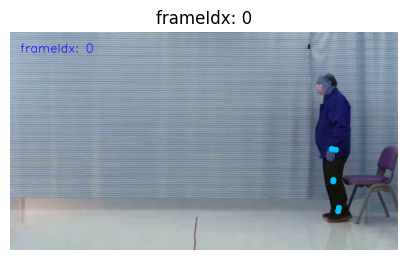

100%|██████████| 135/135 [00:02<00:00, 50.56it/s]


In [41]:
AD_subject_list = [4, 9, 10, 11, 12, 16, 17, 18, 20, 24, 25, 26, 27, 28, 31, 32, 35, 36, 37, 38, 39, 40, 45, 46, 48, 59, 60, 61, 62, 65]

for pid in all_pid_list:
    # if pid==30:
    if pid==38:
        heatmap_dict = {}
        heatmap_dict = FS_read_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
        # print(len(heatmap_dict["cut2M"]))
        
        FS_show_GradCAM_on_video(pid, VIDEO_PATH, COORDINATE_PATH, heatmap_dict, "cut1")
        # FS_show_GradCAM_on_video(pid, VIDEO_PATH, COORDINATE_PATH, heatmap_dict, "cut2M")

In [30]:
heatmap_dict.keys()

dict_keys(['cut1', 'cut2M'])

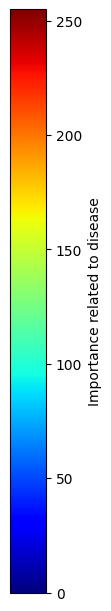

In [90]:
fig, ax = plt.subplots(figsize=(1, 6), layout='constrained')

cmap = mpl.cm.jet
norm = mpl.colors.Normalize(vmin=0, vmax=255)

fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
             cax=ax, orientation='vertical', label='Importance related to disease')

* AD subjects
4, 9, 10, 11, 12, 16, 17, 18, 20, 23~28, 31, 32, 35, 36, 37, 38, 39, 40, 45, 46, 48, 59~62, 65

# Tracks

## colormap: jets

In [26]:
from scipy.signal import find_peaks

n_FEATURE = 12
Coord_Path = "../../4_Cut_Video/data/"

In [27]:
def read_gradcam_explanation_from_csv_file(target_pid, dir_path):
    heatmap_dict = {}
    for fname in list(os.listdir(dir_path)): ### ex. "37_cut1_Segment1.csv"
        pid = int(fname.split("_")[0])       ### ex. 37
        videoType = fname.split("_")[1]      ### ex. cut1
        segmentName = fname.split(".")[0].split("_")[2]    ### ex. Segment1

        if pid==target_pid:
            filepath = dir_path + fname      ### ex. "Walking_Model2_0409/FS_Dynamic_GradCAM_Explanations/37_cut1_Segment1.csv"
            df = pd.read_csv(filepath, index_col=0, header=None) ### Set first column as index

            if videoType not in heatmap_dict:
                heatmap_dict[videoType] = {}
            heatmap_dict[videoType][segmentName] = df
    return heatmap_dict


def get_timestamp_heatmap_value(pid, heatmap_dict, videoType):
    heatmap_dict = heatmap_dict[videoType] ### ex. heatmap_dict.keys() = ["Segment0", "Segment1"]
    segmentNames = list(heatmap_dict.keys())
    segmentNames.sort()
    sorted_dict = {segName: heatmap_dict[segName] for segName in segmentNames}
    heatmap_dict = sorted_dict
    
    ### Get heatmap predicted probability --------------------------------------------------
    label = label_dict[pid]
    foldIdx = foldIdx_dict[pid]
    threshold = FS_threshold_walk_5f[foldIdx]
    prob_dict = FS_segProb_cut1_dict[pid] ### ex. prob_dict = {'segment_0': 0.876, 'segment_1': 0.9994}
    prob_dict_rename = {} ### ex. prob_dict_rename = {'Segment0': 0.876, 'Segment1': 0.9994}
    for key in prob_dict:
        prob = prob_dict[key]
        segName = 'Segment' + str(key.split('_')[1])
        prob_dict_rename[segName] = prob
    
    
    n_segment = len(heatmap_dict)
    n_frame = (n_segment-1)*n_GAP + n_PERIOD
    Hip = [0] * n_frame
    Knee = [0] * n_frame
    Ankle = [0] * n_frame
    Times = [0] * n_frame
    colorData = [0] * n_frame
    
    start = 0
    end = n_PERIOD
    for key in heatmap_dict:
        prob = prob_dict_rename[key]
        isValid_heatmap = False
        
        if label==0:
            if prob<threshold: isValid_heatmap = True
        elif label==1:
            if prob>threshold: isValid_heatmap = True
        
        if isValid_heatmap==True:
            heatmap = heatmap_dict[key] ### heatmap for one segment

            n_feature, n_timestamp = heatmap.shape[0], heatmap.shape[1] ### 9 features with 50 timestamp
            heatmap = heatmap.iloc[:, :].values

            for i in range(n_timestamp):
                cur_frame = start + i

                hip1, hip2, hip3 = heatmap[0][i], heatmap[3][i], heatmap[6][i]
                knee1, knee2, knee3 = heatmap[1][i], heatmap[4][i], heatmap[7][i]
                ankle1, ankle2, ankle3 = heatmap[2][i], heatmap[5][i], heatmap[8][i]

                hip = max(hip1, hip2, hip3)
                knee = max(knee1, knee2, knee3)
                ankle = max(ankle1, ankle2, ankle3)

                Hip[cur_frame] += hip
                Knee[cur_frame] += knee
                Ankle[cur_frame] += ankle
                Times[cur_frame] += 1
                # colorData[cur_frame] += hip
                # colorData[cur_frame] += knee
                # colorData[cur_frame] += ankle
                colorData[cur_frame] += max(hip, knee, ankle)
                # colorData[cur_frame] += max(hip1, knee1, ankle1)
                # colorData[cur_frame] += (hip+knee+ankle)/3
                # colorData[cur_frame] += (ankle1+ankle2+ankle3)/3
                
                
        start += n_GAP
        end = start + n_PERIOD

    for i in range(n_frame):
        if Times[i]!=0:
            Hip[i] = int(Hip[i]/Times[i])
            Knee[i] = int(Knee[i]/Times[i])
            Ankle[i] = int(Ankle[i]/Times[i])
            colorData[i] = int(colorData[i]/Times[i])
    # for i in range(n_frame):
    #     colorData[i] = max(Hip[i], Knee[i], Ankle[i])
    return colorData
    

def show_all_pid_walking_track_with_GradCAM(pidList, flag_label):
    # if flag_label=="AD":
    #     target_pidList = [18, 20, 24, 25, 26, 36, 37, 38, 45, 46, 60, 62]
    # elif flag_label=="CN":
    #     target_pidList = [3, 22, 30, 34, 43, 49, 51, 52, 57, 58, 68, 73, 74, 77, 83, 85, 87, 90, 92, 93, 95, 97, 99]
        
    for pid in pidList:
        # if pid in target_pidList:
        # if pid==20 or pid==49 or pid==95:
        # if pid==18 or pid==20 or pid==24 or pid==25 or pid==26 or pid==36 or pid==37 or pid==38 or pid==45 or pid==46 or pid==60 or pid==62:
        label = label_dict[pid]
        if label==1: label_name = "AD"
        if label==0: label_name = "CN"

        if label_name==flag_label:
            ### Get each timestamp heatmap value ---------------------------------------------------
            heatmap_dict = read_gradcam_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
            colorData = get_timestamp_heatmap_value(pid, heatmap_dict, "cut1")
            n_valid_timestamp = len(colorData)


            ### Get coordinate data [xAnkleMinus] --------------------------------------------------
            if pid>=1 and pid<=9: coord_file = Coord_Path + ("%02d" % pid) + '/Walking_20240307/' + ("%02d" % pid) + '_cut1_keypoints1_3.csv' # 4_Cut_Video/data/01/Walking_20240307/01_cut2_keypoints1_3.cs
            else: coord_file = Coord_Path + str(pid) + '/Walking_20240307/' + str(pid) + '_cut1_keypoints1_3.csv'

            df = pd.read_csv(coord_file, header=None)
            df.columns = heatmap_feature_name
            yData = df.loc[:, 'xAnkleMinus'].values
            yData = yData[0:n_valid_timestamp]
            n_timestamp, n_feature = df.shape[0], df.shape[1]


            ### Visualize results ------------------------------------------------------------------
            xData = np.arange(0, n_valid_timestamp)
            plt.figure(figsize=(10, 3))
            plt.plot(yData, color='black')
            # plt.scatter(xData, yData, c=colorData, cmap='viridis')
            plt.scatter(xData, yData, c=colorData, cmap='jet')
            plt.xlim([-10, 200])
            plt.ylim([-50, 400])
            plt.title(f'[Pid {pid}], Lable: {label_name}, Prob: {pidProb_dict[pid]}')
            plt.show()

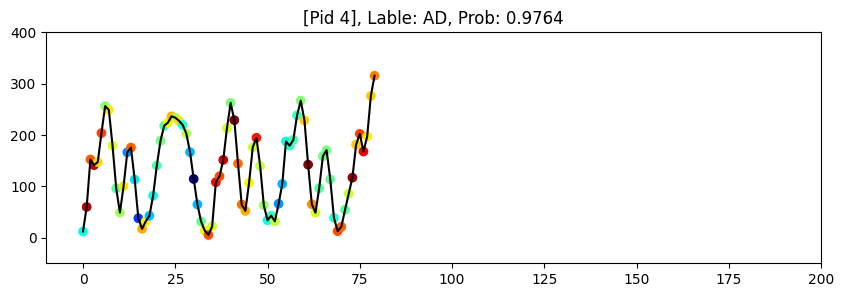

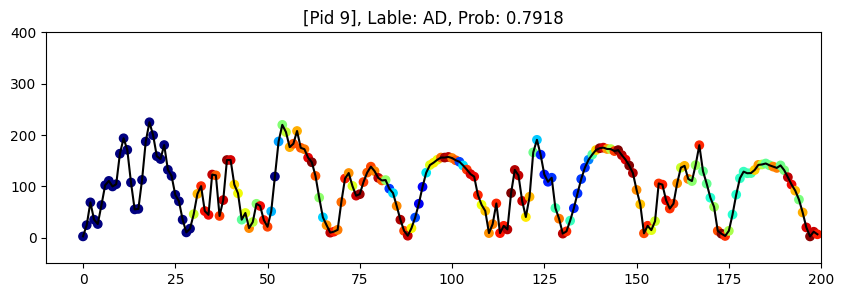

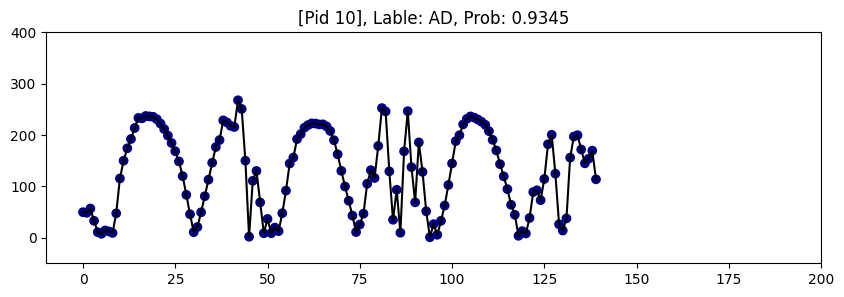

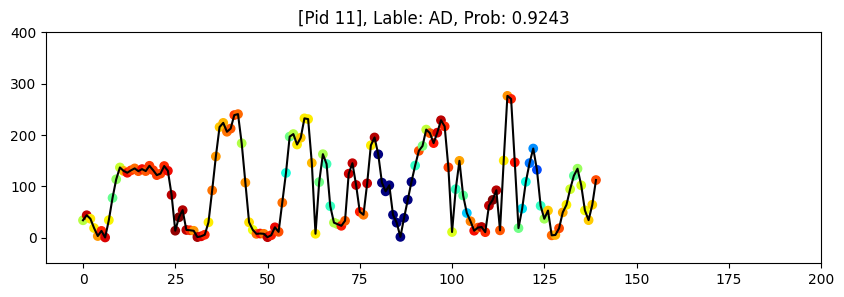

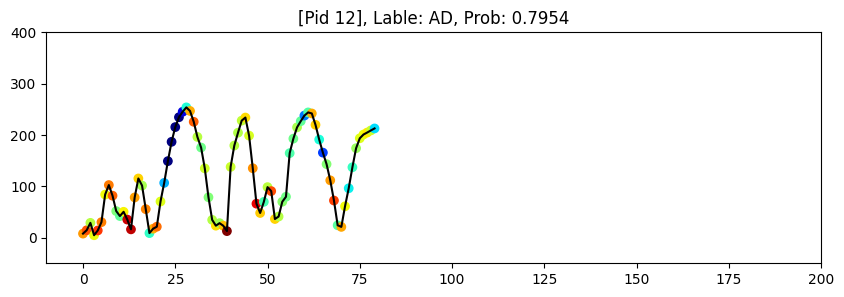

...

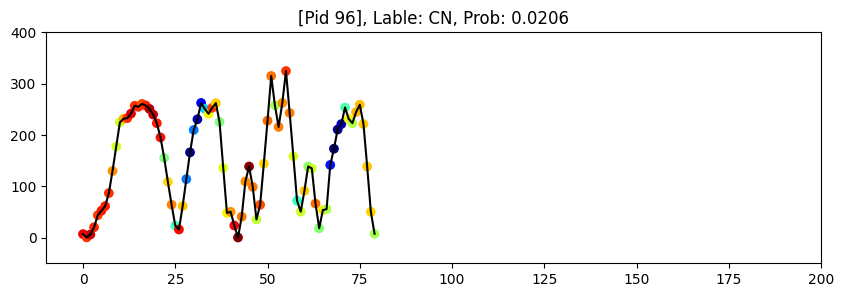

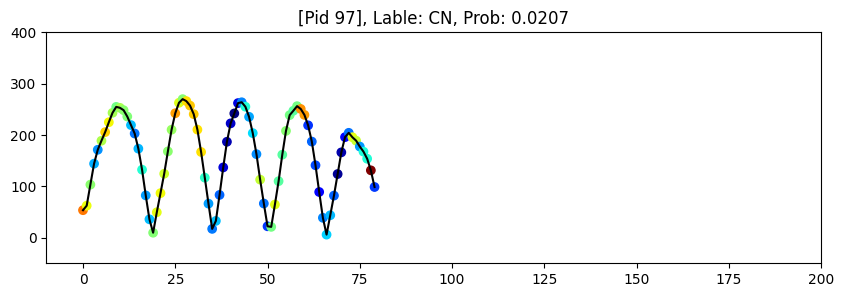

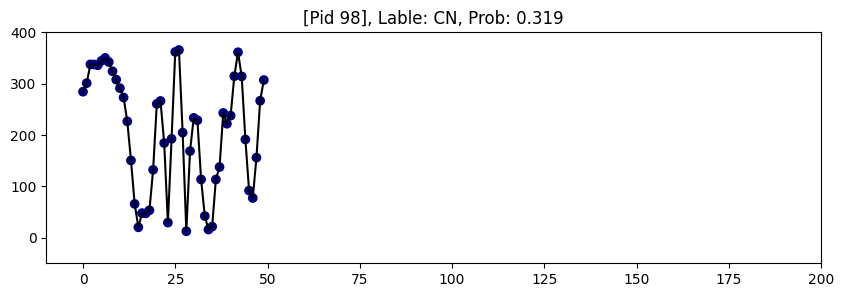

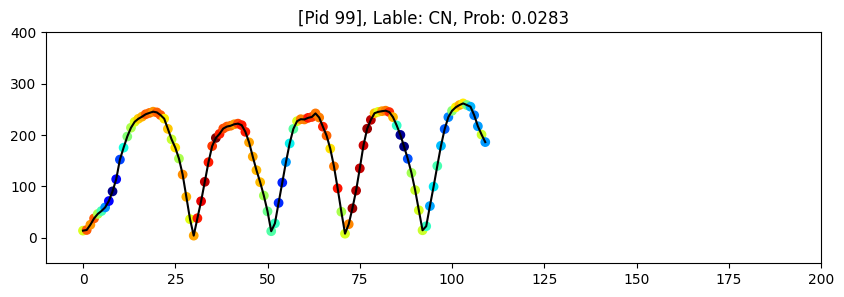

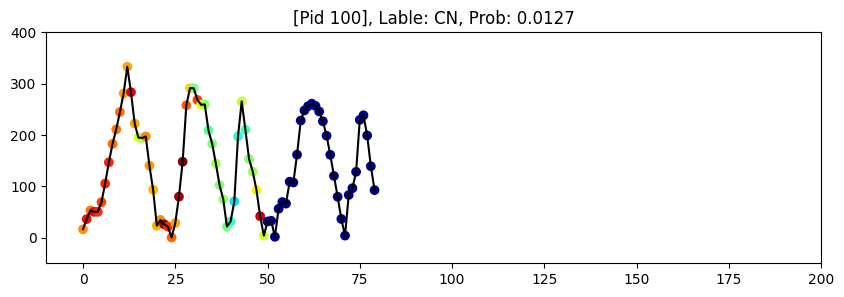

In [28]:
show_all_pid_walking_track_with_GradCAM(all_pid_list, "AD")
show_all_pid_walking_track_with_GradCAM(all_pid_list, "CN")

## colormap: Reds, Blues

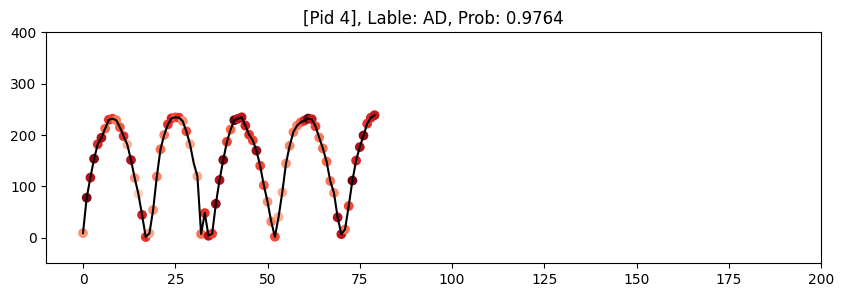

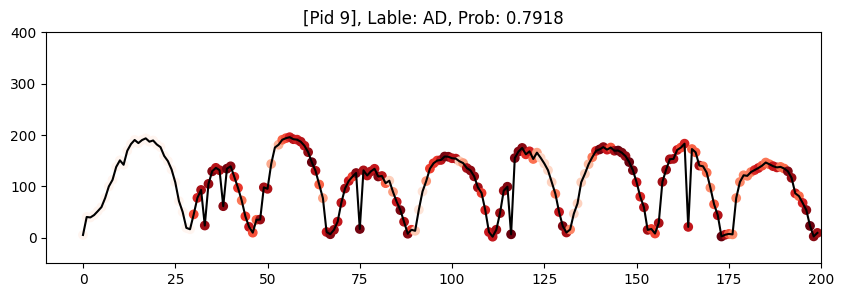

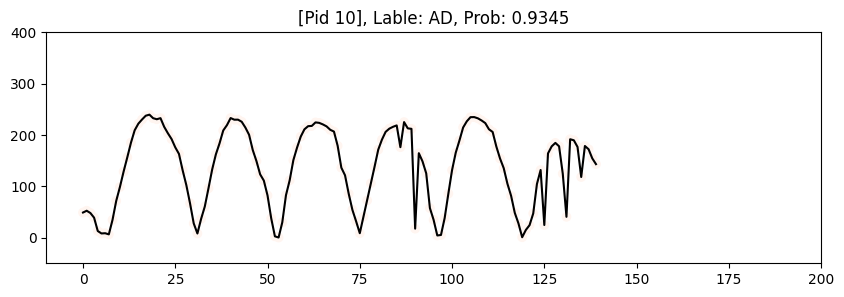

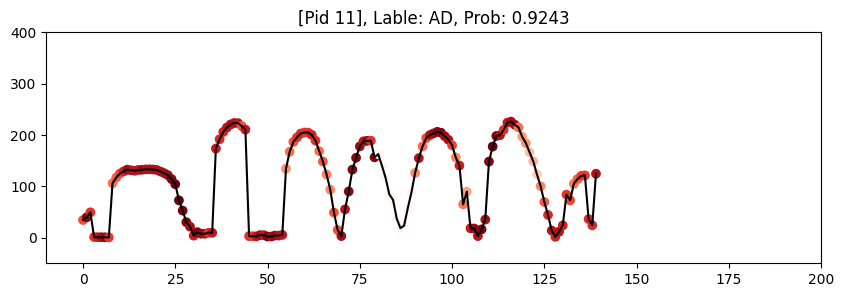

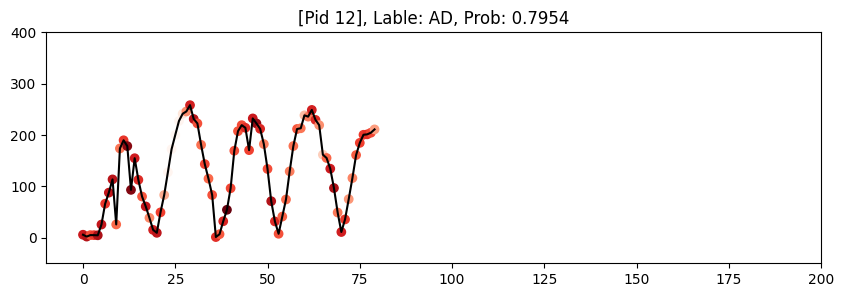

...

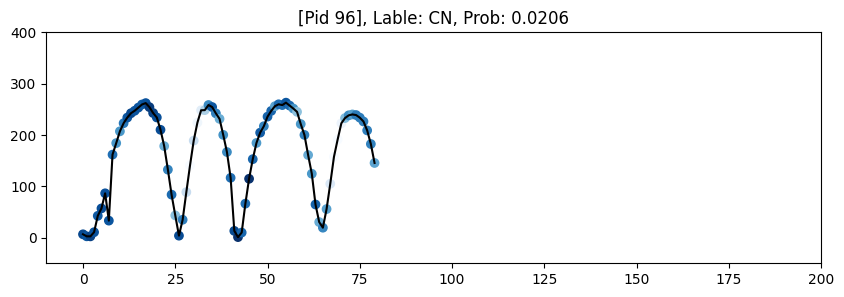

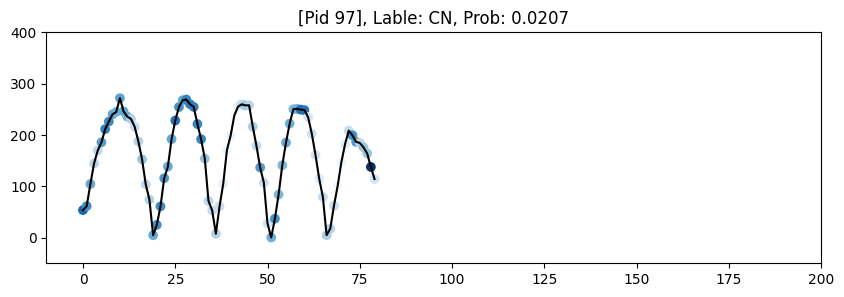

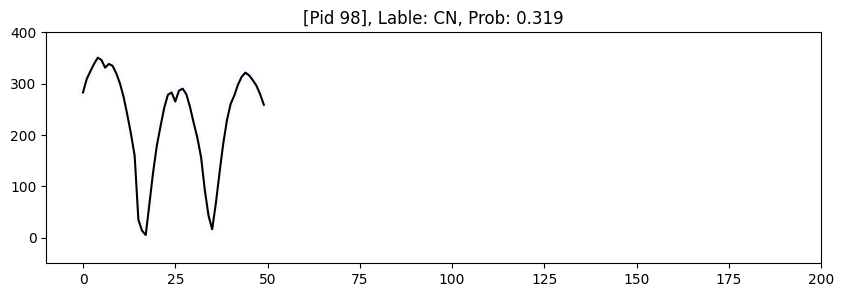

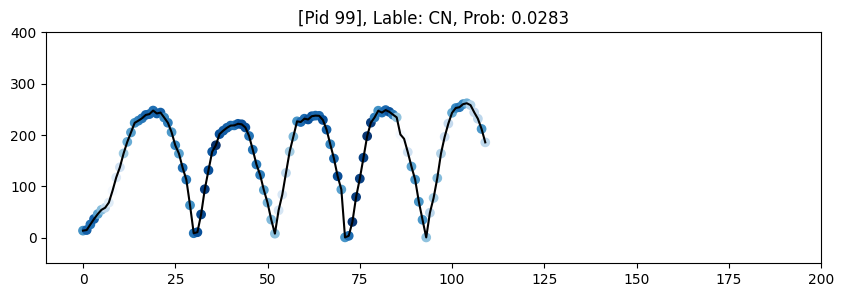

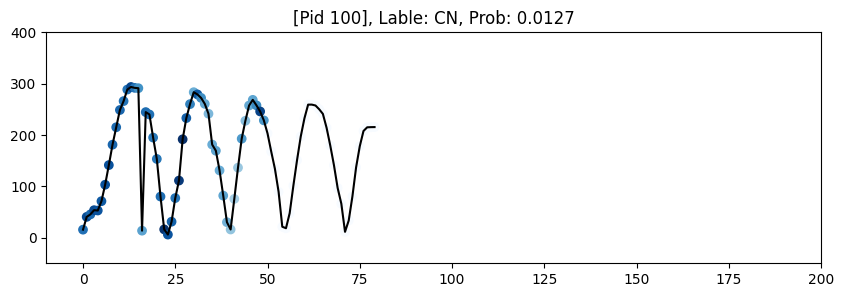

In [22]:
def read_gradcam_explanation_from_csv_file(target_pid, dir_path):
    heatmap_dict = {}
    for fname in list(os.listdir(dir_path)): ### ex. "37_cut1_Segment1.csv"
        pid = int(fname.split("_")[0])       ### ex. 37
        videoType = fname.split("_")[1]      ### ex. cut1
        segmentName = fname.split(".")[0].split("_")[2]    ### ex. Segment1

        if pid==target_pid:
            filepath = dir_path + fname      ### ex. "Walking_Model2_0409/FS_Dynamic_GradCAM_Explanations/37_cut1_Segment1.csv"
            df = pd.read_csv(filepath, index_col=0, header=None) ### Set first column as index

            if videoType not in heatmap_dict:
                heatmap_dict[videoType] = {}
            heatmap_dict[videoType][segmentName] = df
    return heatmap_dict


def get_timestamp_heatmap_value(pid, heatmap_dict, videoType):
    heatmap_dict = heatmap_dict[videoType] ### ex. heatmap_dict.keys() = ["Segment0", "Segment1"]
    segmentNames = list(heatmap_dict.keys())
    segmentNames.sort()
    sorted_dict = {segName: heatmap_dict[segName] for segName in segmentNames}
    heatmap_dict = sorted_dict
    
    ### Get heatmap predicted probability --------------------------------------------------
    label = label_dict[pid]
    foldIdx = foldIdx_dict[pid]
    threshold = FS_threshold_walk_5f[foldIdx]
    prob_dict = FS_segProb_cut1_dict[pid] ### ex. prob_dict = {'segment_0': 0.876, 'segment_1': 0.9994}
    prob_dict_rename = {} ### ex. prob_dict_rename = {'Segment0': 0.876, 'Segment1': 0.9994}
    for key in prob_dict:
        prob = prob_dict[key]
        segName = 'Segment' + str(key.split('_')[1])
        prob_dict_rename[segName] = prob
    
    
    n_segment = len(heatmap_dict)
    n_frame = (n_segment-1)*n_GAP + n_PERIOD
    Hip = [0] * n_frame
    Knee = [0] * n_frame
    Ankle = [0] * n_frame
    Times = [0] * n_frame
    colorData = [0] * n_frame
    
    start = 0
    end = n_PERIOD
    for key in heatmap_dict:
        prob = prob_dict_rename[key]
        isValid_heatmap = False
        
        if label==0:
            if prob<threshold: isValid_heatmap = True
        elif label==1:
            if prob>threshold: isValid_heatmap = True
        
        if isValid_heatmap==True:
            heatmap = heatmap_dict[key] ### heatmap for one segment

            n_feature, n_timestamp = heatmap.shape[0], heatmap.shape[1] ### 9 features with 50 timestamp
            heatmap = heatmap.iloc[:, :].values

            for i in range(n_timestamp):
                cur_frame = start + i

                hip1, hip2, hip3 = heatmap[0][i], heatmap[3][i], heatmap[6][i]
                knee1, knee2, knee3 = heatmap[1][i], heatmap[4][i], heatmap[7][i]
                ankle1, ankle2, ankle3 = heatmap[2][i], heatmap[5][i], heatmap[8][i]

                hip = max(hip1, hip2, hip3)
                knee = max(knee1, knee2, knee3)
                ankle = max(ankle1, ankle2, ankle3)

                Hip[cur_frame] += hip
                Knee[cur_frame] += knee
                Ankle[cur_frame] += ankle
                Times[cur_frame] += 1
                # colorData[cur_frame] += hip
                # colorData[cur_frame] += knee
                # colorData[cur_frame] += ankle
                colorData[cur_frame] += max(hip, knee, ankle)
                # colorData[cur_frame] += max(hip1, knee1, ankle1)
                # colorData[cur_frame] += (hip+knee+ankle)/3
                # colorData[cur_frame] += (ankle1+ankle2+ankle3)/3
                
        start += n_GAP
        end = start + n_PERIOD

    for i in range(n_frame):
        if Times[i]!=0:
            Hip[i] = int(Hip[i]/Times[i])
            Knee[i] = int(Knee[i]/Times[i])
            Ankle[i] = int(Ankle[i]/Times[i])
            colorData[i] = int(colorData[i]/Times[i])
    # for i in range(n_frame):
    #     colorData[i] = max(Hip[i], Knee[i], Ankle[i])
    return colorData
    

def show_all_pid_walking_track_with_GradCAM(pidList, flag_label):
    # if flag_label=="AD":
    #     target_pidList = [18, 20, 24, 25, 26, 36, 37, 38, 45, 46, 60, 62]
    # elif flag_label=="CN":
    #     target_pidList = [3, 22, 30, 34, 43, 49, 51, 52, 57, 58, 68, 73, 74, 77, 83, 85, 87, 90, 92, 93, 95, 97, 99]
        
    for pid in pidList:
        # if pid in target_pidList:
        # if pid==70:
        # if pid==20 or pid==49 or pid==95:
        # if pid==18 or pid==20 or pid==24 or pid==25 or pid==26 or pid==36 or pid==37 or pid==38 or pid==45 or pid==46 or pid==60 or pid==62:
        # if pid==30 or pid==76 or pid==18 or pid==27 or pid==38:
        label = label_dict[pid]
        if label==1: label_name = "AD"
        if label==0: label_name = "CN"

        if label_name==flag_label:
            ### Get each timestamp heatmap value ---------------------------------------------------
            heatmap_dict = read_gradcam_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
            colorData = get_timestamp_heatmap_value(pid, heatmap_dict, "cut1")
            n_valid_timestamp = len(colorData)


            ### Get coordinate data [xAnkleMinus] --------------------------------------------------
            # if pid>=1 and pid<=9: coord_file = Coord_Path + ("%02d" % pid) + '/Walking_20240307/' + ("%02d" % pid) + '_cut1_keypoints1_3.csv' # 4_Cut_Video/data/01/Walking_20240307/01_cut2_keypoints1_3.cs
            # else: coord_file = Coord_Path + str(pid) + '/Walking_20240307/' + str(pid) + '_cut1_keypoints1_3.csv'
            if pid>=1 and pid<=9: coord_file = Coord_Path + ("%02d" % pid) + '/Walking_0817/' + ("%02d" % pid) + '_cut1_keypoints1_3.csv'
            else: coord_file = Coord_Path + str(pid) + '/Walking_0817/' + str(pid) + '_cut1_keypoints1_3.csv'

            df = pd.read_csv(coord_file, header=None)
            df.columns = heatmap_feature_name
            yData = df.loc[:, 'xAnkleMinus'].values
            yData = yData[0:n_valid_timestamp]
            n_timestamp, n_feature = df.shape[0], df.shape[1]


            ### Visualize results ------------------------------------------------------------------
            xData = np.arange(0, n_valid_timestamp)
            plt.figure(figsize=(10, 3))
            plt.plot(yData, color='black')
            # plt.scatter(xData, yData, c=colorData, cmap='viridis')
            if flag_label=="AD":
                plt.scatter(xData, yData, c=colorData, cmap='Reds')
            elif flag_label=="CN":
                plt.scatter(xData, yData, c=colorData, cmap='Blues')
            plt.xlim([-10, 200])
            plt.ylim([-50, 400])
            plt.title(f'[Pid {pid}], Lable: {label_name}, Prob: {pidProb_dict[pid]}')
            plt.show()
            
            
show_all_pid_walking_track_with_GradCAM(all_pid_list, "AD")
show_all_pid_walking_track_with_GradCAM(all_pid_list, "CN")

## In one figure

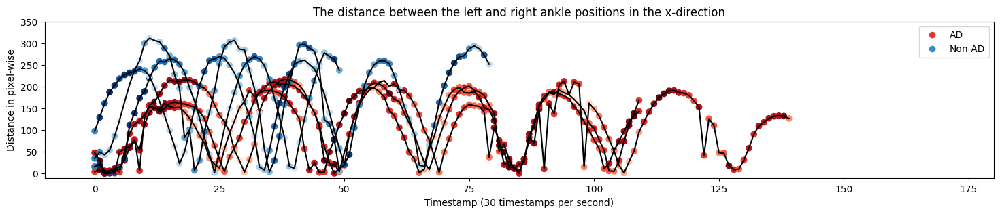

In [49]:
def read_gradcam_explanation_from_csv_file(target_pid, dir_path):
    heatmap_dict = {}
    for fname in list(os.listdir(dir_path)): ### ex. "37_cut1_Segment1.csv"
        pid = int(fname.split("_")[0])       ### ex. 37
        videoType = fname.split("_")[1]      ### ex. cut1
        segmentName = fname.split(".")[0].split("_")[2]    ### ex. Segment1

        if pid==target_pid:
            filepath = dir_path + fname      ### ex. "Walking_Model2_0409/FS_Dynamic_GradCAM_Explanations/37_cut1_Segment1.csv"
            df = pd.read_csv(filepath, index_col=0, header=None) ### Set first column as index

            if videoType not in heatmap_dict:
                heatmap_dict[videoType] = {}
            heatmap_dict[videoType][segmentName] = df
    return heatmap_dict


def get_timestamp_heatmap_value(pid, heatmap_dict, videoType):
    heatmap_dict = heatmap_dict[videoType] ### ex. heatmap_dict.keys() = ["Segment0", "Segment1"]
    segmentNames = list(heatmap_dict.keys())
    segmentNames.sort()
    sorted_dict = {segName: heatmap_dict[segName] for segName in segmentNames}
    heatmap_dict = sorted_dict
    
    ### Get heatmap predicted probability --------------------------------------------------
    label = label_dict[pid]
    foldIdx = foldIdx_dict[pid]
    threshold = FS_threshold_walk_5f[foldIdx]
    prob_dict = FS_segProb_cut1_dict[pid] ### ex. prob_dict = {'segment_0': 0.876, 'segment_1': 0.9994}
    prob_dict_rename = {} ### ex. prob_dict_rename = {'Segment0': 0.876, 'Segment1': 0.9994}
    for key in prob_dict:
        prob = prob_dict[key]
        segName = 'Segment' + str(key.split('_')[1])
        prob_dict_rename[segName] = prob
    
    
    n_segment = len(heatmap_dict)
    n_frame = (n_segment-1)*n_GAP + n_PERIOD
    Hip = [0] * n_frame
    Knee = [0] * n_frame
    Ankle = [0] * n_frame
    Times = [0] * n_frame
    colorData = [0] * n_frame
    
    start = 0
    end = n_PERIOD
    for key in heatmap_dict:
        prob = prob_dict_rename[key]
        isValid_heatmap = False
        
        if label==0:
            if prob<threshold: isValid_heatmap = True
        elif label==1:
            if prob>threshold: isValid_heatmap = True
        
        if isValid_heatmap==True:
            heatmap = heatmap_dict[key] ### heatmap for one segment

            n_feature, n_timestamp = heatmap.shape[0], heatmap.shape[1] ### 9 features with 50 timestamp
            heatmap = heatmap.iloc[:, :].values

            for i in range(n_timestamp):
                cur_frame = start + i

                hip1, hip2, hip3 = heatmap[0][i], heatmap[3][i], heatmap[6][i]
                knee1, knee2, knee3 = heatmap[1][i], heatmap[4][i], heatmap[7][i]
                ankle1, ankle2, ankle3 = heatmap[2][i], heatmap[5][i], heatmap[8][i]

                hip = max(hip1, hip2, hip3)
                knee = max(knee1, knee2, knee3)
                ankle = max(ankle1, ankle2, ankle3)

                Hip[cur_frame] += hip
                Knee[cur_frame] += knee
                Ankle[cur_frame] += ankle
                Times[cur_frame] += 1
                # colorData[cur_frame] += hip
                # colorData[cur_frame] += knee
                # colorData[cur_frame] += ankle
                colorData[cur_frame] += max(hip, knee, ankle)
                # colorData[cur_frame] += max(hip1, knee1, ankle1)
                # colorData[cur_frame] += (hip+knee+ankle)/3
                # colorData[cur_frame] += (ankle1+ankle2+ankle3)/3
                
        start += n_GAP
        end = start + n_PERIOD

    for i in range(n_frame):
        if Times[i]!=0:
            Hip[i] = int(Hip[i]/Times[i])
            Knee[i] = int(Knee[i]/Times[i])
            Ankle[i] = int(Ankle[i]/Times[i])
            colorData[i] = int(colorData[i]/Times[i])
    # for i in range(n_frame):
    #     colorData[i] = max(Hip[i], Knee[i], Ankle[i])
    return colorData
    

def show_all_pid_walking_track_with_GradCAM_inOne(pidList):
    # plt.figure(figsize=(20, 6))
    # plt.figure(figsize=(20, 3))

    # plt.figure(figsize=(15, 3))
    plt.figure(figsize=(18, 3))
    
    for pid in pidList:
        # if pid==30 or pid==85 or pid==97:
        # if pid==38 or pid==26 or pid==27:
        # if pid==38 or pid==26 or pid==27 or pid==30 or pid==85 or pid==97:

        # if pid==24 or pid==26 or pid==27:
        # if pid==24 or pid==26 or pid==27 or pid==30 or pid==85 or pid==97:
        # if pid==38:

        # if pid==30 or pid==95 or pid==76:
        # if pid==27 or pid==38 or pid==26: ## pid==4
        if pid==30 or pid==95 or pid==76 or pid==27 or pid==38 or pid==26:

            label = label_dict[pid]

            ### Get each timestamp heatmap value ---------------------------------------------------
            heatmap_dict = read_gradcam_explanation_from_csv_file(pid, FS_GRADCAM_PATH)
            colorData = get_timestamp_heatmap_value(pid, heatmap_dict, "cut1")
            n_valid_timestamp = len(colorData)


            ### Get coordinate data [xAnkleMinus] --------------------------------------------------
            # if pid>=1 and pid<=9: coord_file = Coord_Path + ("%02d" % pid) + '/Walking_20240307/' + ("%02d" % pid) + '_cut1_keypoints1_3.csv' # 4_Cut_Video/data/01/Walking_20240307/01_cut2_keypoints1_3.cs
            # else: coord_file = Coord_Path + str(pid) + '/Walking_20240307/' + str(pid) + '_cut1_keypoints1_3.csv'

            if pid>=1 and pid<=9: coord_file = Coord_Path + ("%02d" % pid) + '/Walking_0817/' + ("%02d" % pid) + '_cut1_keypoints1_3.csv' # 4_Cut_Video/data/01/Walking_20240307/01_cut2_keypoints1_3.cs
            else: coord_file = Coord_Path + str(pid) + '/Walking_0817/' + str(pid) + '_cut1_keypoints1_3.csv'

            df = pd.read_csv(coord_file, header=None)
            df.columns = heatmap_feature_name
            yData = df.loc[:, 'xAnkleMinus'].values
            yData = yData[0:n_valid_timestamp]
            n_timestamp, n_feature = df.shape[0], df.shape[1]


            ### Visualize results ------------------------------------------------------------------
            xData = np.arange(0, n_valid_timestamp)
            plt.plot(yData, color='black')
            if label==1:
                plt.scatter(xData, yData, c=colorData, cmap='Reds', label='AD')
            elif label==0:
                plt.scatter(xData, yData, c=colorData, cmap='Blues', label='Non-AD')
    plt.xlim([-10, 180])
    plt.ylim([-10, 350])
    def legend_without_duplicate_labels(figure):
        handles, labels = plt.gca().get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        figure.legend(by_label.values(), by_label.keys())
    legend_without_duplicate_labels(plt)
    # plt.legend()
    plt.title(f'The distance between the left and right ankle positions in the x-direction')
    # plt.title(f'The distance between the left and right ankle positions in the x-direction (Subject Id: 24, 26, 27)')
    plt.xlabel(f'Timestamp (30 timestamps per second)')
    plt.ylabel(f'Distance in pixel-wise')
    # plt.colorbar()
    plt.show()
            
            
show_all_pid_walking_track_with_GradCAM_inOne(all_pid_list)

## Without heatmap value

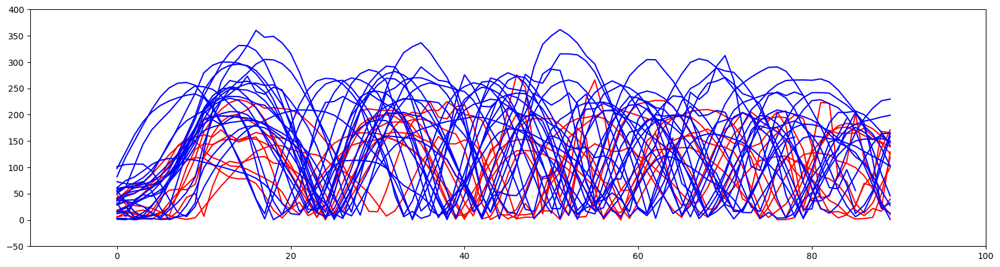

In [157]:
def walking_track_analysis(pidList):
    max_timestamp = 0
    target_feature_index = 5

    ### Get longest time value --------------------------------------------
    for pid in pidList:
        # if pid==1:
        # if pid != 46:
        coord_file = Coord_Path + str(pid) + '/Walking_20240307/' + str(pid) + '_cut1_keypoints1_3.csv' # 4_Cut_Video/data/01/Walking_20240307/01_cut2_keypoints1_3.csv
        if pid>=1 and pid<=9: coord_file = Coord_Path + ("%02d" % pid) + '/Walking_20240307/' + ("%02d" % pid) + '_cut1_keypoints1_3.csv'
        if not os.path.exists(coord_file):
            print(f'[Pid {pid}] Coordinate CSV file doest not exist.')
        else:
            df = pd.read_csv(coord_file, header=None)
            n_timestamp, n_feature = df.shape[0], df.shape[1]
            if n_timestamp < 80:
                max_timestamp = max(max_timestamp, n_timestamp)

    plt.figure(figsize=(20, 5))
    for pid in pidList:
        # if pid==10 or pid==18 or pid==20 or pid==24 or pid==26 or pid==27 or pid==37 or pid==38 or pid==60 or pid==61 or pid==62:
        # if pid==20:
        if pid==18 or pid==20 or pid==24 or pid==26 or pid==27 or pid==37 or pid==38 or pid==60 or pid==61 or pid==62:
            coord_file = Coord_Path + str(pid) + '/Walking_20240307/' + str(pid) + '_cut1_keypoints1_3.csv' # 4_Cut_Video/data/01/Walking_20240307/01_cut2_keypoints1_3.csv
            if pid>=1 and pid<=9: coord_file = Coord_Path + ("%02d" % pid) + '/Walking_20240307/' + ("%02d" % pid) + '_cut1_keypoints1_3.csv'

            label = label_dict[pid]

            df = pd.read_csv(coord_file, header=None)
            n_timestamp, n_feature = df.shape[0], df.shape[1]

            df.columns = heatmap_feature_name
            data = df.loc[:, 'xAnkleMinus'].values
            peaks_lower, _ = find_peaks(-data)
            time = np.arange(1, len(data)+1)
            # data = data[:50]
            # time = np.arange(1, 51)


            
            # plt.scatter(time, data, color='red')
            plt.plot(data[0:90], color='red', label='AD')
            # plt.plot(peaks_lower, data[peaks_lower], "o", color='blue')
            plt.xlim([-10, 100])
            plt.ylim([-50, 400])
            # plt.title(f'[Pid {pid}]')
            # plt.show()
    
    
    for pid in pidList:
        # if pid==1 or pid==2 or pid==3 or pid==22 or pid==30 or pid==33 or pid==34 or pid==43 or pid==49 or pid==51 or pid==57 or pid==58 or pid==63 or pid==68 or pid==73 or pid==74 or pid==77 or pid==80 or pid==83 or pid==85 or pid==87 or pid==90 or pid==92 or pid==95 or pid==97:
        # if pid==1:
        if pid==1 or pid==2 or pid==3 or pid==22 or pid==30 or pid==34 or pid==43 or pid==49 or pid==51 or pid==57 or pid==58 or pid==63 or pid==68 or pid==73 or pid==74 or pid==77 or pid==83 or pid==87 or pid==90 or pid==92 or pid==95 or pid==97:
            coord_file = Coord_Path + str(pid) + '/Walking_20240307/' + str(pid) + '_cut1_keypoints1_3.csv' # 4_Cut_Video/data/01/Walking_20240307/01_cut2_keypoints1_3.csv
            if pid>=1 and pid<=9: coord_file = Coord_Path + ("%02d" % pid) + '/Walking_20240307/' + ("%02d" % pid) + '_cut1_keypoints1_3.csv'

            label = label_dict[pid]

            df = pd.read_csv(coord_file, header=None)
            n_timestamp, n_feature = df.shape[0], df.shape[1]

            df.columns = heatmap_feature_name
            data = df.loc[:, 'xAnkleMinus'].values
            avg = np.average(data)
            peaks_lower, _ = find_peaks(-data)
            time = np.arange(1, len(data)+1)
            # data = data[:50]
            # time = np.arange(1, 51)

            # plt.figure(figsize=(20, 5))
            # plt.scatter(time, data, color='blue')
            plt.plot(data[0:90], color='blue', label='NC')
            # plt.plot(peaks_lower, data[peaks_lower], "o", color='red')
            # plt.axhline(y=avg, color='red')
            plt.xlim([-10, 100])
            plt.ylim([-50, 400])
            # plt.title(f'[Pid {pid}]')
    # plt.legend()
    plt.show()
    
walking_track_analysis(all_pid_list)

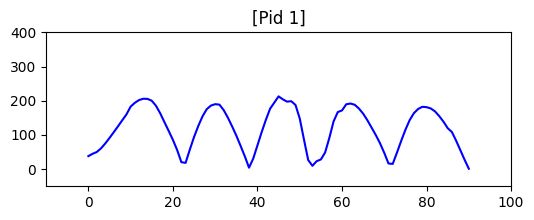

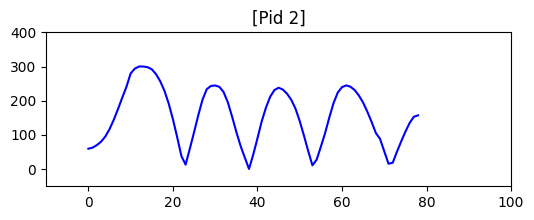

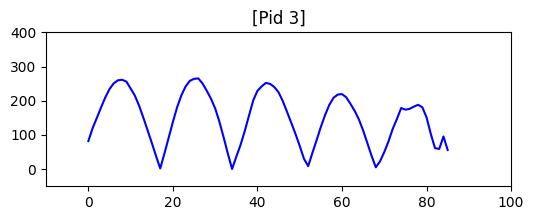

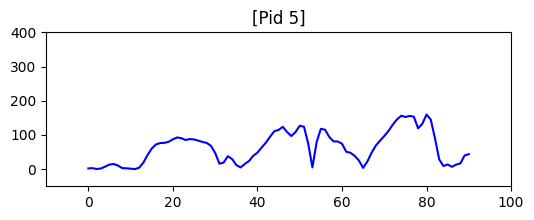

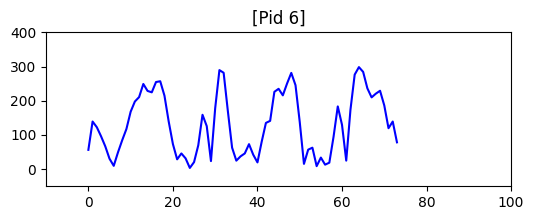

...

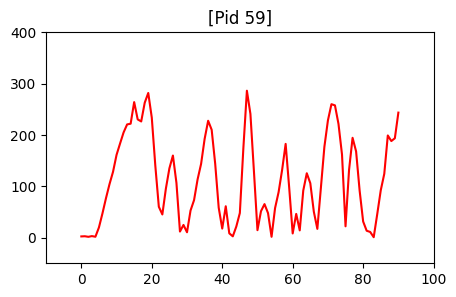

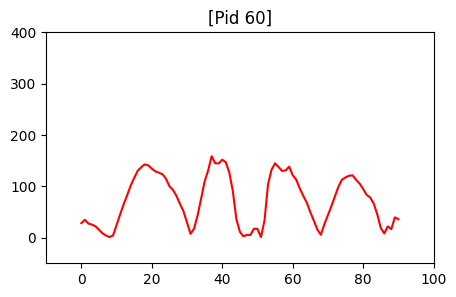

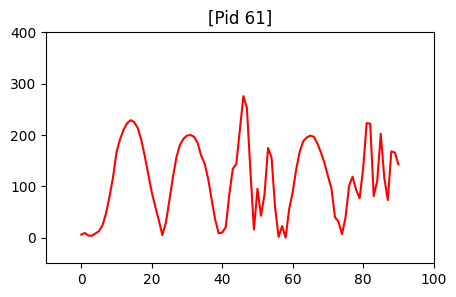

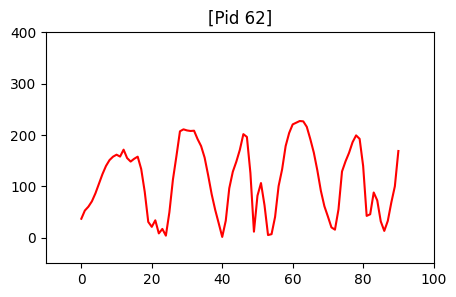

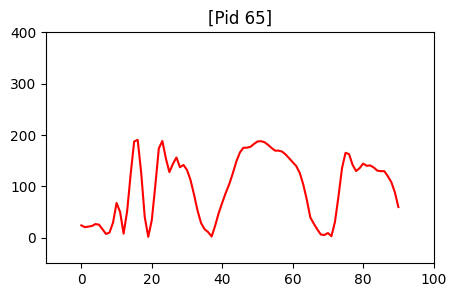

min_timestamp: 50 frames
max_timestamp: 414 frames


In [162]:
def show_all_pid_walking_track(pidList):
    min_timestamp, max_timestamp = 500, 0
    target_feature_index = 5
    
    for pid in pidList:
        coord_file = Coord_Path + str(pid) + '/Walking_20240307/' + str(pid) + '_cut1_keypoints1_3.csv' # 4_Cut_Video/data/01/Walking_20240307/01_cut2_keypoints1_3.csv
        if pid>=1 and pid<=9: coord_file = Coord_Path + ("%02d" % pid) + '/Walking_20240307/' + ("%02d" % pid) + '_cut1_keypoints1_3.csv'
        
        label = label_dict[pid]
        
        df = pd.read_csv(coord_file, header=None)
        n_timestamp, n_feature = df.shape[0], df.shape[1]
        if n_timestamp<min_timestamp: min_timestamp = n_timestamp
        if n_timestamp>max_timestamp: max_timestamp = n_timestamp
        
        df.columns = heatmap_feature_name
        data = df.loc[:, 'xAnkleMinus'].values
        
        if label==0: ### CN
            plt.figure(figsize=(6, 2))
            # plt.scatter(time, data, color='blue')
            plt.plot(data[0: 91], color='blue')
            plt.xlim([-10, 100])
            plt.ylim([-50, 400])
            plt.title(f'[Pid {pid}]')
            plt.show()
    
    
    for pid in pidList:
        coord_file = Coord_Path + str(pid) + '/Walking_20240307/' + str(pid) + '_cut1_keypoints1_3.csv' # 4_Cut_Video/data/01/Walking_20240307/01_cut2_keypoints1_3.csv
        if pid>=1 and pid<=9: coord_file = Coord_Path + ("%02d" % pid) + '/Walking_20240307/' + ("%02d" % pid) + '_cut1_keypoints1_3.csv'
        
        label = label_dict[pid]
        
        df = pd.read_csv(coord_file, header=None)
        n_timestamp, n_feature = df.shape[0], df.shape[1]
        if n_timestamp<min_timestamp: min_timestamp = n_timestamp
        if n_timestamp>max_timestamp: max_timestamp = n_timestamp
        
        df.columns = heatmap_feature_name
        data = df.loc[:, 'xAnkleMinus'].values
        
        if label==1: ### CN
            plt.figure(figsize=(5, 3))
            # plt.scatter(time, data, color='red')
            plt.plot(data[0: 91], color='red')
            plt.xlim([-10, 100])
            plt.ylim([-50, 400])
            plt.title(f'[Pid {pid}]')
            plt.show()
    
    print(f'min_timestamp: {min_timestamp} frames')
    print(f'max_timestamp: {max_timestamp} frames')

    
show_all_pid_walking_track(all_pid_list)